In [3]:
import numpy as np
import pandas as pd
import pymc3 as pm
import arviz as az
import geopandas as gpd
import matplotlib.pyplot as plt

import pickle

from shapely.geometry import Point
from sklearn.metrics import mean_absolute_error, r2_score

%reload_ext autoreload
%autoreload 2

from utils import *
from gaussian_processes import GaussianProcess

az.style.use('arviz-whitegrid')

WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


# Gaussian Processes for Yield Prediction - Potato
<font size = 5>
As standard bayesian models, we will use Gaussian Processes to fit a function that calculates Yield crop

In [4]:
# Set random seed
np.random.seed(42)

## Load and build the dataset
<font size=5>
For simplicity, we start with only 2 features, the most relevant according to the linear regression model

In [5]:
# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)
cy = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)
cy

,Area,hg/ha_yield,avg_rain_mm_per_year,pesticides_kg_per_ha,avg_temp,lat,lon,elev
0,Albania,153105.043478,1485.0,2.184838,16.326957,41.0,20.0,708.0
1,Algeria,182413.956522,89.0,1.110530,17.488261,28.0,3.0,800.0
2,Angola,59085.739130,1010.0,0.027360,24.303043,-12.5,18.5,1112.0
3,Argentina,262059.173913,591.0,2.488804,17.708478,-34.0,-64.0,595.0
4,Armenia,151076.904762,562.0,0.493300,9.580952,40.0,45.0,1792.0
...,...,...,...,...,...,...,...,...
90,Ukraine,125038.857143,565.0,2.121930,8.413333,49.0,32.0,175.0
91,United Kingdom,406131.695652,1220.0,6.246453,9.602783,54.0,-2.0,75.0
92,Uruguay,146737.043478,1300.0,6.608791,16.980870,-33.0,-56.0,109.0
93,Zambia,115800.652174,1020.0,1.066569,21.064783,-15.0,30.0,1138.0


<font size=5>
Remove less relevant features according to the linear model

In [6]:
cy = cy.drop('lat', axis=1)
cy = cy.drop('lon', axis=1)
cy = cy.drop('elev', axis=1)
cy

,Area,hg/ha_yield,avg_rain_mm_per_year,pesticides_kg_per_ha,avg_temp
0,Albania,153105.043478,1485.0,2.184838,16.326957
1,Algeria,182413.956522,89.0,1.110530,17.488261
2,Angola,59085.739130,1010.0,0.027360,24.303043
3,Argentina,262059.173913,591.0,2.488804,17.708478
4,Armenia,151076.904762,562.0,0.493300,9.580952
...,...,...,...,...,...
90,Ukraine,125038.857143,565.0,2.121930,8.413333
91,United Kingdom,406131.695652,1220.0,6.246453,9.602783
92,Uruguay,146737.043478,1300.0,6.608791,16.980870
93,Zambia,115800.652174,1020.0,1.066569,21.064783


<font size=5>
Get geodata for plot world map

In [7]:
countries = cy['Area'].unique()
world = get_geodata(countries)

<font size=5>
Get the features and the target feature

In [8]:
cy = cy.drop('Area', axis=1)
print(cy.describe())
x_data = cy.drop('hg/ha_yield', axis=1).to_numpy()
y_data = cy['hg/ha_yield'].to_numpy()

         hg/ha_yield  avg_rain_mm_per_year  pesticides_kg_per_ha   avg_temp
count      95.000000             95.000000             95.000000  95.000000
mean   181841.413334           1019.326316              3.143013  17.850083
std     96668.731420            696.800613              4.049940   7.388661
min     20516.217391             51.000000              0.003028   3.459565
25%    127517.738095            577.000000              0.217843  10.646667
50%    160965.434783            788.000000              1.590888  18.163478
75%    224914.108696           1492.500000              4.085821  24.843652
max    448891.538462           3240.000000             20.888427  29.718696


<font size=5>
Set the indices of the sample for testing

In [9]:
num_test_results = 10
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)
train_indices = np.array([i for i in range(len(y_data)) if i not in test_indices])
x_test_data, y_test_data = x_data[test_indices], y_data[test_indices]

<font size=5>
Standardize the data

In [10]:
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

n_samples, n_features = x_std_data.shape

In [11]:
results = {}

## First model

<font size=5>
We're gonna build:
$$
f(x) \sim \mathcal{G}\mathcal{P} (m(x), k(x, x'))
$$
The observations  are the unknown function plus noise
$$
\epsilon \sim N(0, \Sigma) \\
y = f(x) + \epsilon
$$

<font size=5>
    Let's start with the most used kernel, the <b>Exponential Quadratic</b>

$$
\phi(x,x') = \exp \left( -\frac{||x-x'||^2}{2\ell^2} \right)
$$

In [79]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [9]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=8_000, tune=4_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 4_000 tune and 8_000 draw iterations (8_000 + 16_000 draws total) took 334 seconds.


<font size=5>
Plot of the posterior and the trace

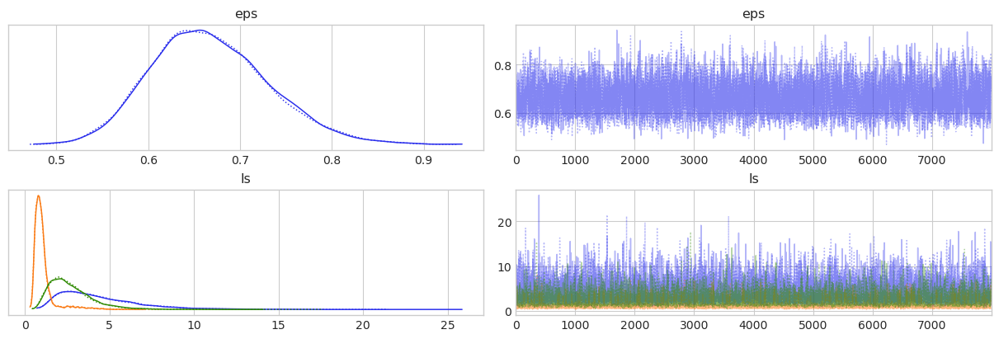

In [10]:
plot_trace(trace, ['eps', 'ls'])

<font size=5>
Check autocorrelation of variables samples

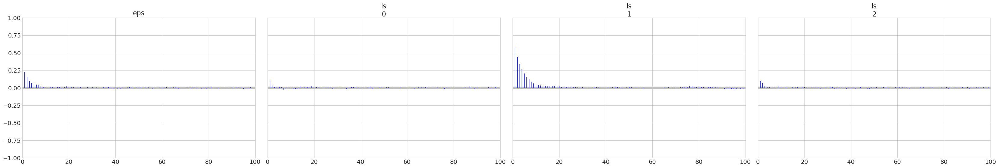

In [11]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

<font size=5>
Conditioning and sampling for test points. <br>

In [80]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


In [2]:
def sample_conditional(self, trace, x_test, var_name='f_pred',
                       num_pred_samples=256):
    # Sample from the conditional distribution, given new points
    with self.model:
        f_pred = self.gp.conditional(var_name, x_test)
        pred_samples = pm.fast_sample_posterior_predictive(
            trace, var_names=[var_name],
            samples=num_pred_samples
        )
        pred_samples = pred_samples[var_name]
    return pred_samples

<font size=5>
Then plot the median, HDI 50% (darker blue), HDI 94% (blue)

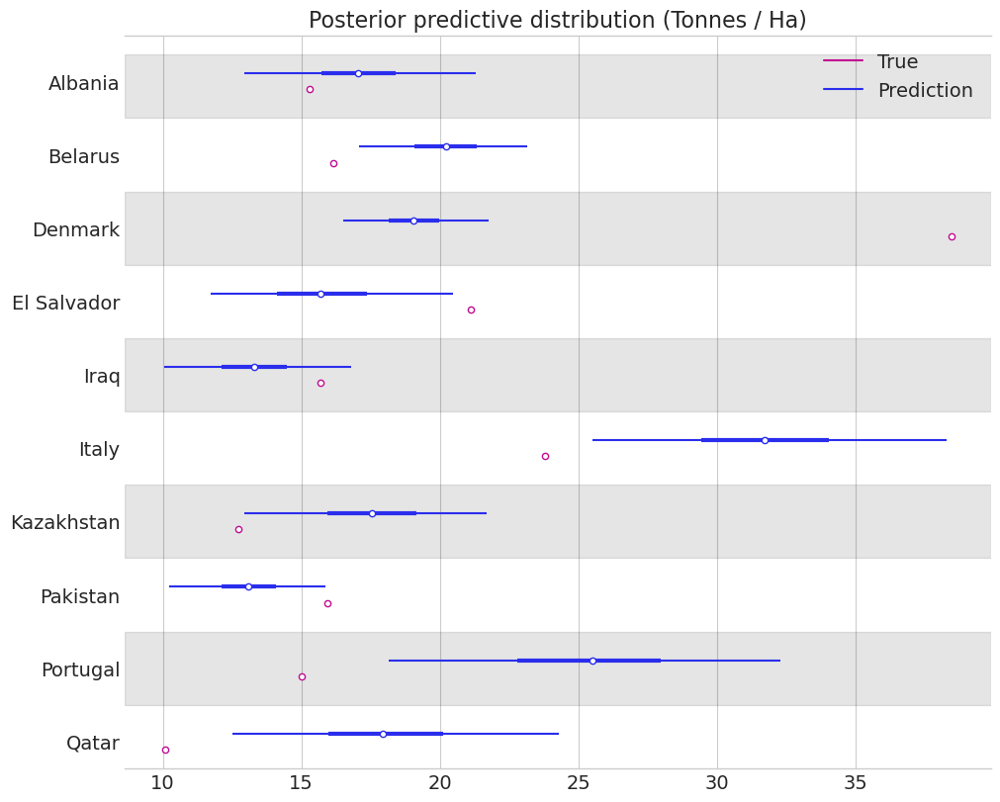

In [81]:
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices])

<font size=5>
Wide and 'uncertain' distributions
<br><br>

Plot of the posterior predictive distribution on the target

[]

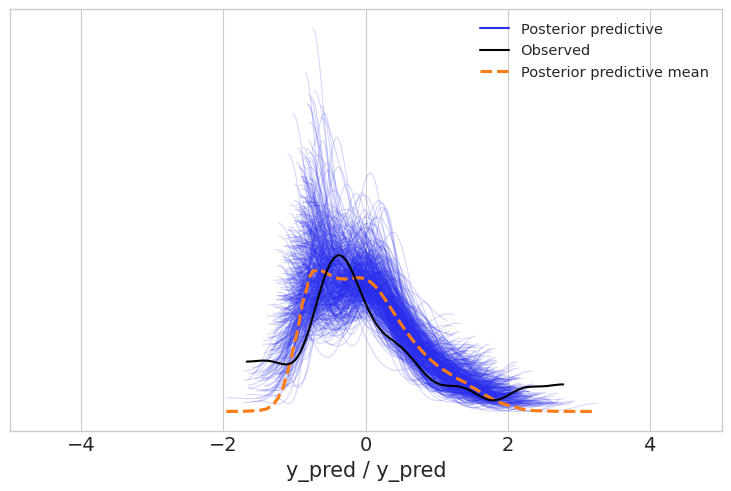

In [85]:
ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
ax = az.plot_ppc(ppc_data, num_pp_samples=512)
ax.set_xlim((-5, 5))
plt.plot()

<font size=5>
Compute Mean Average Error by using median of sampled values, as the distributions are skewed

In [24]:
mae= compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

MAE: 5.1526 (Tonnes / Ha)


<font size=5>
NOTE: This plots will be repeated for each experiment

In [86]:
results['expquad1'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

<style type="text/css">
h3 { /* Header 3 */
  font-size: 27px;
  font-family: "Times New Roman", Times, serif;
  color: DarkBlue;
}
</style>
### More samples
<font size=5>
Let's get more samples in order to check if we would need more

In [88]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [20]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 649 seconds.


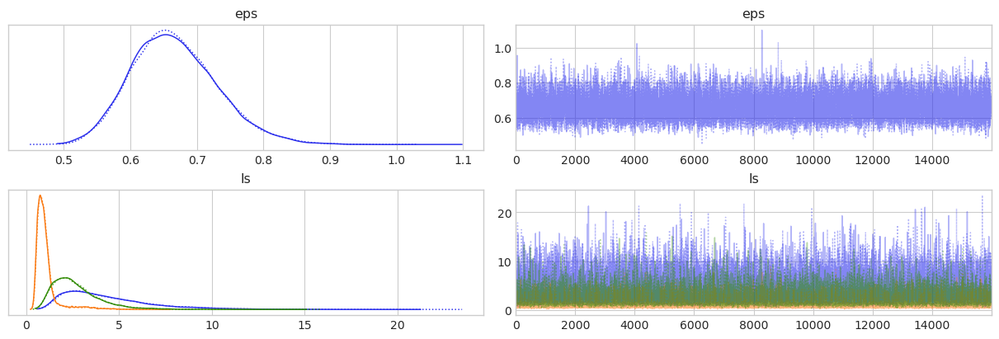

In [21]:
plot_trace(trace, ['eps', 'ls'])

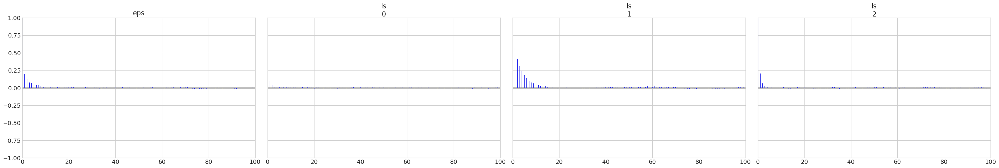

In [22]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [89]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


<font size=5>
Comparison of posteriors on points <br>

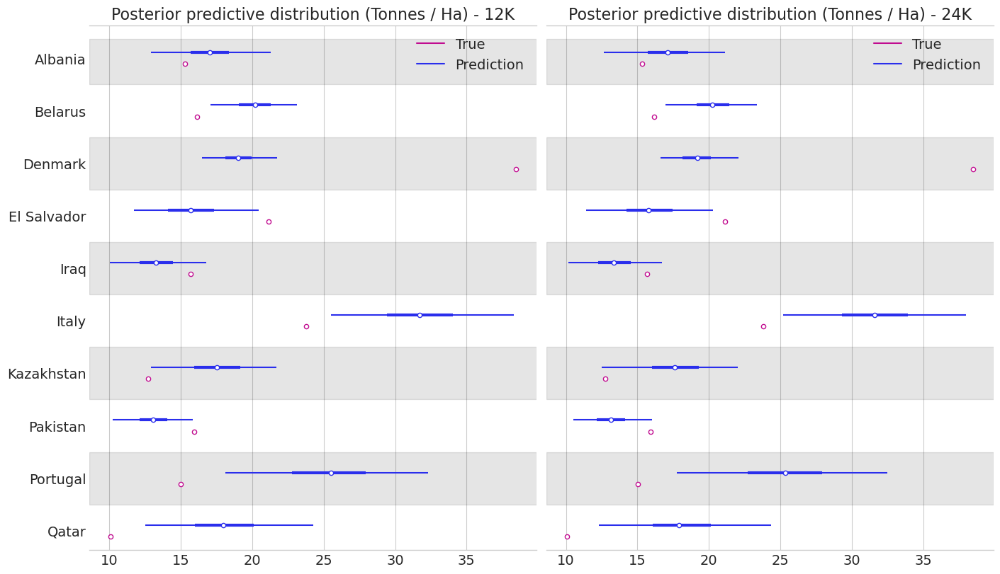

In [90]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad1']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - 12K')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - 24K')
plt.show()

<font size=5>
Seems not to change a lot
<br><br>

Comparison of posterior predictive for target value

[]

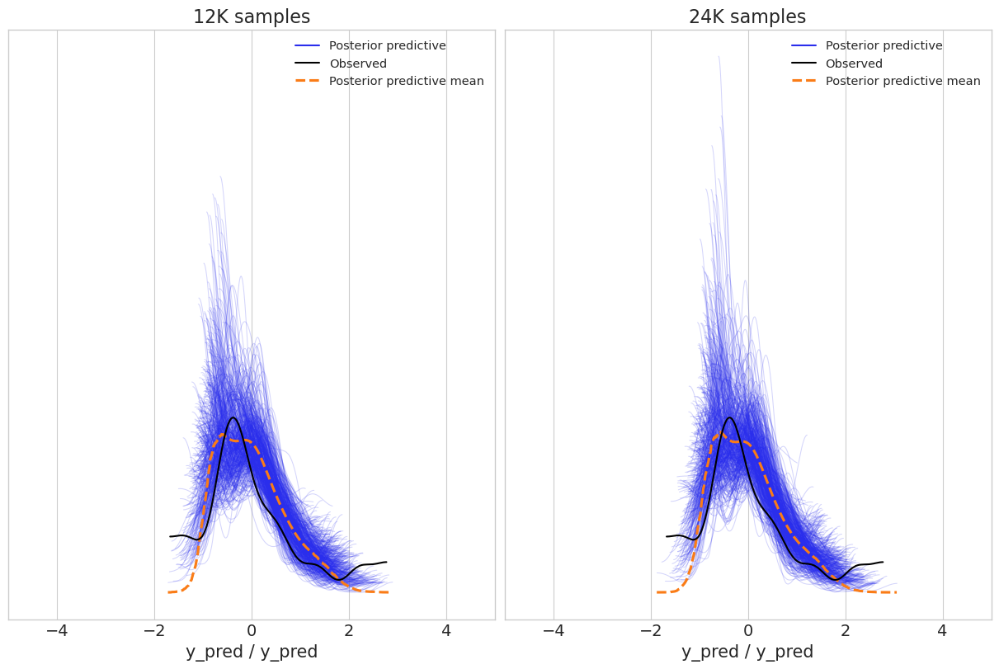

In [93]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('12K samples')
ax2.set_title('24K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad1']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

In [22]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("12K MAE: {:.4f} (Tonnes / Ha)".format(results['expquad1']['mae'] * 1e-4))
print("24K MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

12K MAE: 5.1526 (Tonnes / Ha)
24K MAE: 5.1382 (Tonnes / Ha)


In [94]:
results['expquad2'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

<h3 size=10>
More more samples

In [95]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [30]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=32_000, tune=16_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 16_000 tune and 32_000 draw iterations (32_000 + 64_000 draws total) took 1209 seconds.


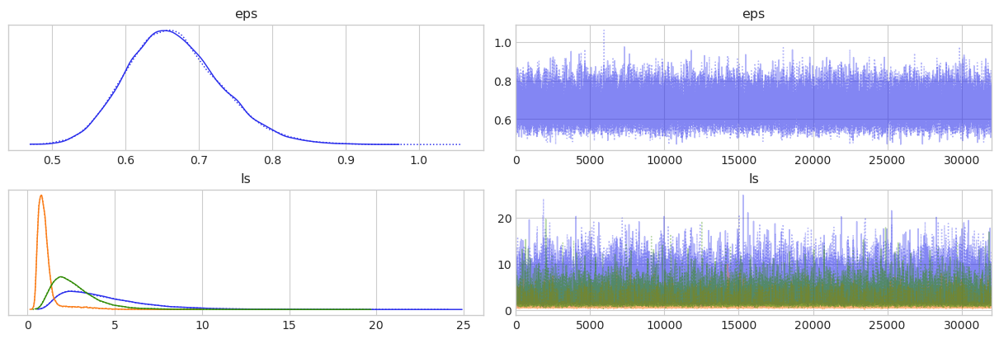

In [31]:
plot_trace(trace, ['eps', 'ls'])

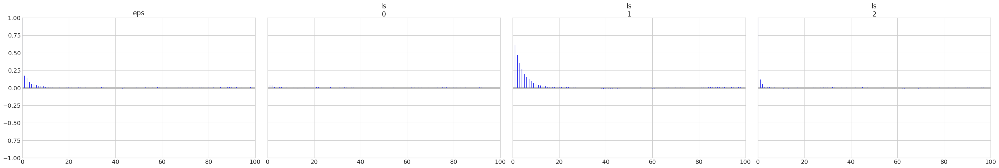

In [32]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [97]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


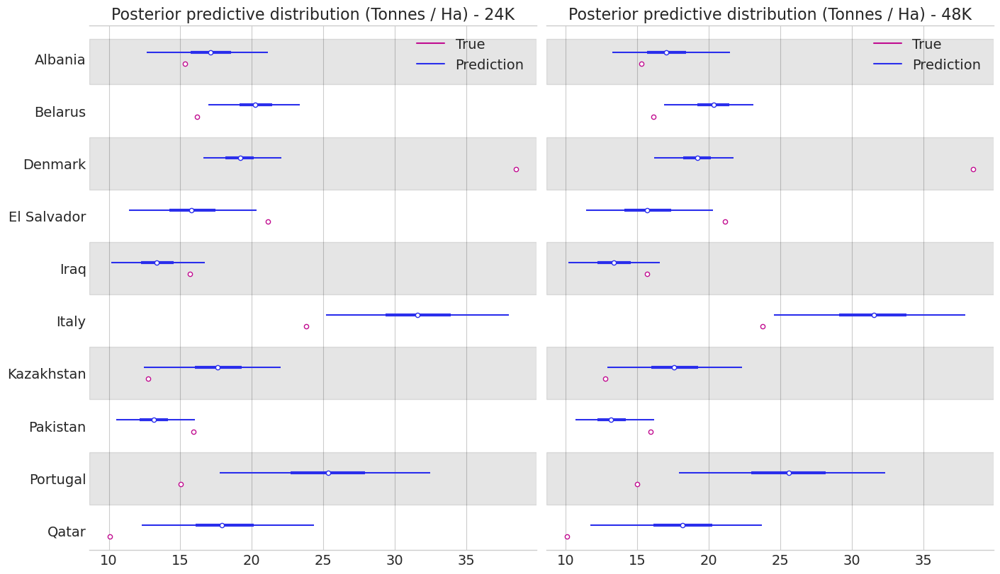

In [98]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - 24K')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - 48K')
plt.show()

[]

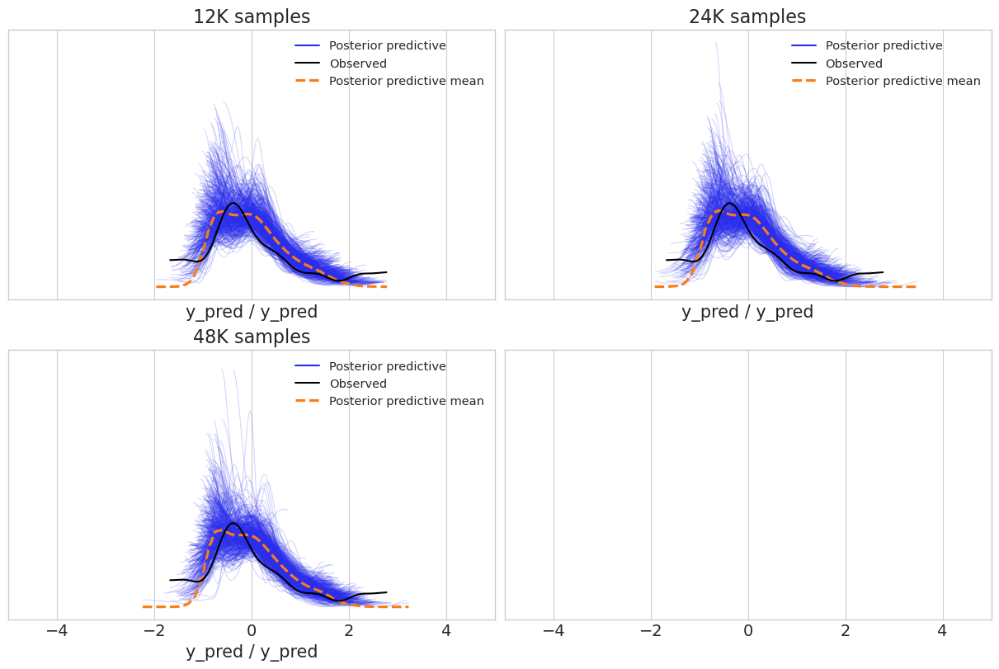

In [99]:
fig, ((ax1, ax2), (ax3, _)) = plt.subplots(ncols=2, nrows=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('12K samples')
ax2.set_title('24K samples')
ax3.set_title('48K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad1']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax3)
ax2.set_xlim((-5, 5))
plt.plot()

In [26]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("12K MAE: {:.4f} (Tonnes / Ha)".format(results['expquad1']['mae'] * 1e-4))
print("24K MAE: {:.4f} (Tonnes / Ha)".format(results['expquad2']['mae'] * 1e-4))
print("48K MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

12K MAE: 5.1526 (Tonnes / Ha)
24K MAE: 5.1382 (Tonnes / Ha)
48K MAE: 5.1492 (Tonnes / Ha)


<font size=5>
We have an actual dicrease by increasing samples
    <br>

In [101]:
results['expquad3'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

###  Hundred of thousand of samples

In [103]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.ExpQuad(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [38]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=128_000, tune=64_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 64_000 tune and 128_000 draw iterations (128_000 + 256_000 draws total) took 4958 seconds.


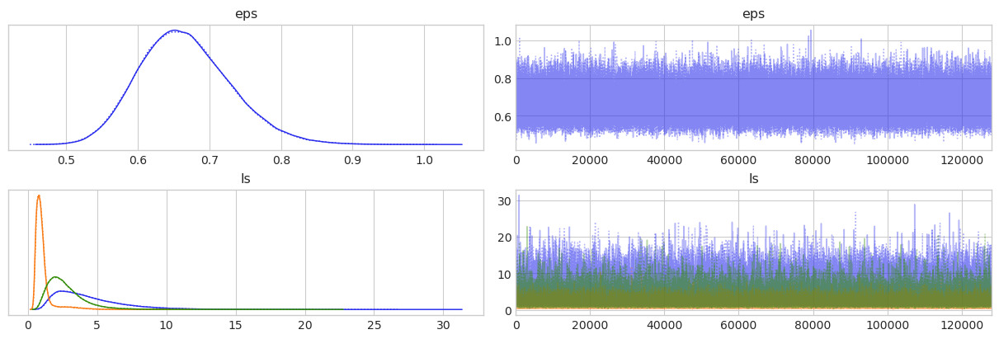

In [39]:
plot_trace(trace, ['eps', 'ls'])

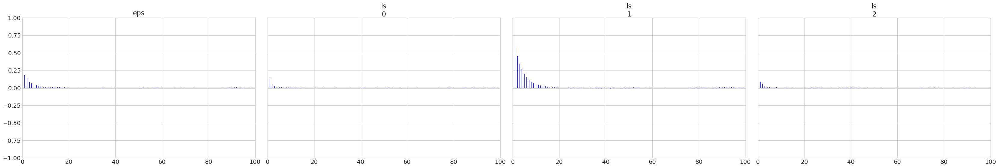

In [40]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [105]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


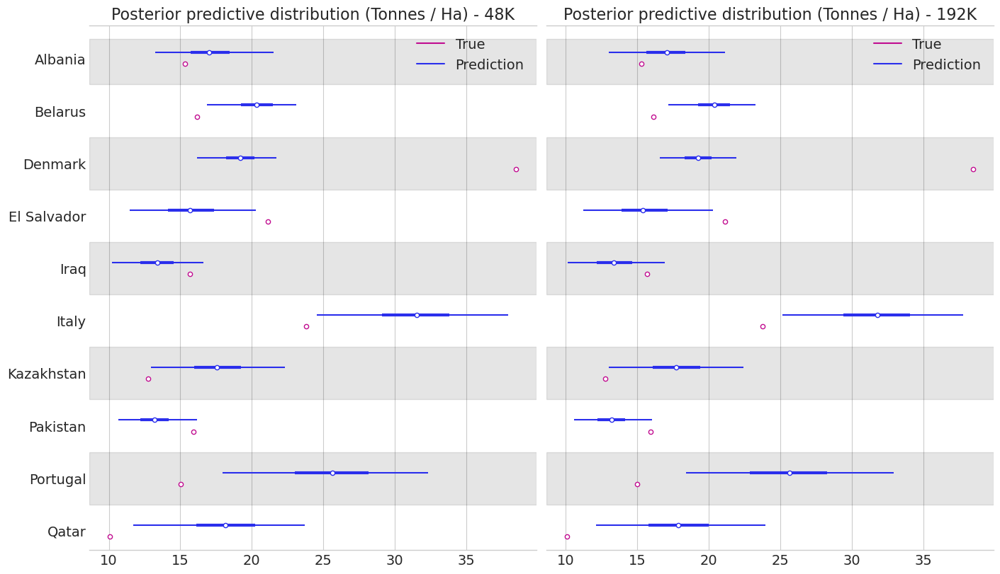

In [106]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad3']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - 48K')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - 192K')
plt.show()

In [28]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("12K  MAE: {:.4f} (Tonnes / Ha)".format(results['expquad1']['mae'] * 1e-4))
print("24K  MAE: {:.4f} (Tonnes / Ha)".format(results['expquad2']['mae'] * 1e-4))
print("48K  MAE: {:.4f} (Tonnes / Ha)".format(results['expquad3']['mae'] * 1e-4))
print("192K MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

12K  MAE: 5.1526 (Tonnes / Ha)
24K  MAE: 5.1382 (Tonnes / Ha)
48K  MAE: 5.1492 (Tonnes / Ha)
192K MAE: 5.1748 (Tonnes / Ha)


[]

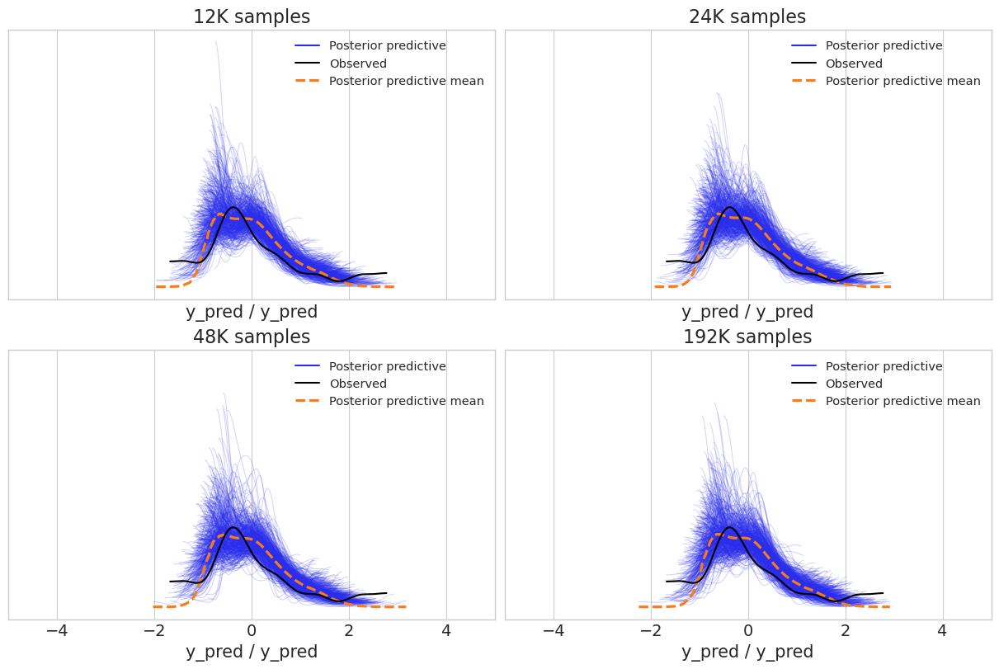

In [108]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('12K samples')
ax2.set_title('24K samples')
ax3.set_title('48K samples')
ax4.set_title('192K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad1']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad3']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax3)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax4)
ax2.set_xlim((-5, 5))
plt.plot()

<font size=5>
Predictive error world plot

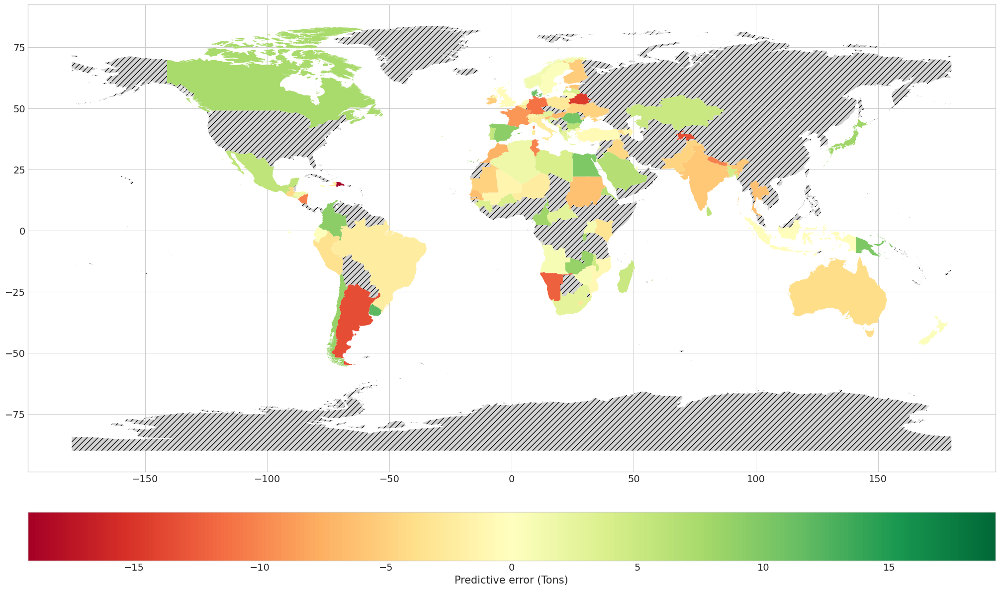

In [14]:
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data)

<font size=5>
There not seem to be any correlation between the error and the position of countries in the world
<br><br>
We choose to sample always 24K samples as it sufficient for the current taks
<br><br><br>

In [109]:
results['expquad4'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Another model, with polynomial kernel, grade 2

<font size=5>
The polynomial kernel is a generalization of the linear.
It corresponds to a polynomial model just as the linear kernel corresponds to a linear one.
$$
k(x, x') = \big[(x - c)(x' - c) + \mathcal{offset}\big]^d
$$

In [12]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    offset = pm.Normal('offset', 0, 0.5)
    c = pm.Normal('c', 0, 0.5, shape=n_features)
    grade = 2
    # Instantiate the covariance function
    cov = pm.gp.cov.Polynomial(n_features, c=c, d=grade, offset=offset) + pm.gp.cov.WhiteNoise(1e-4)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [13]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16000, tune=8000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.95
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, offset]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 960 seconds.
There were 1523 divergences after tuning. Increase `target_accept` or reparameterize.
There were 2579 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 25% for some parameters.


<font size=5>
Sampling produces a lot of divergences

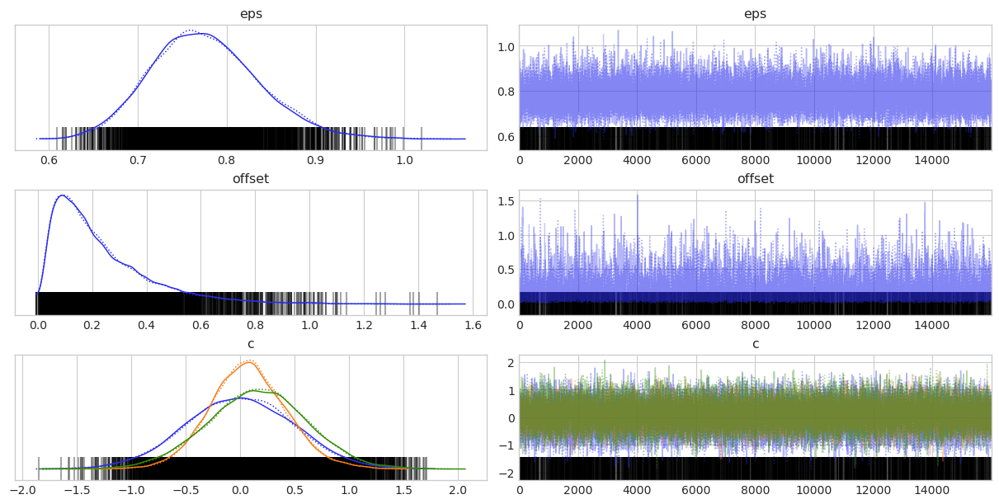

In [14]:
plot_trace(trace, ['eps', 'offset', 'c'])

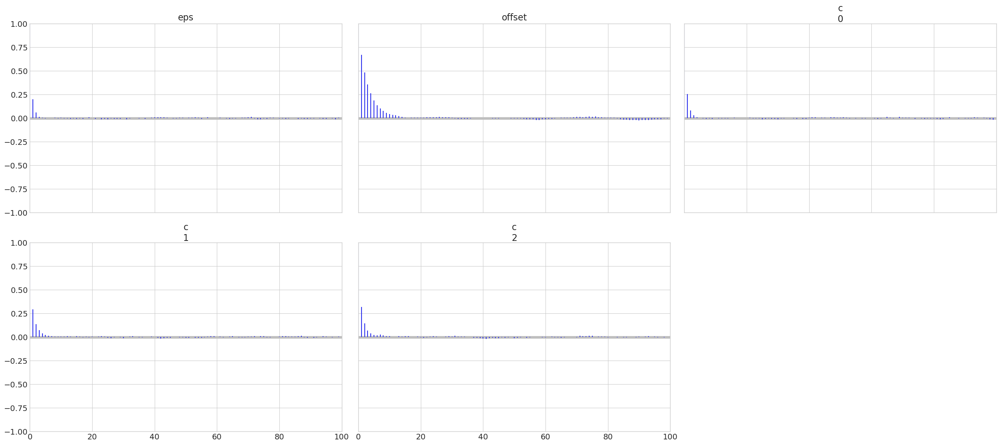

In [15]:
az.plot_autocorr(trace, var_names=['eps', 'offset', 'c'], combined=True)
plt.show()

<font size=5><br><br>
However, we are still able to sample from the conditional distribution

In [16]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


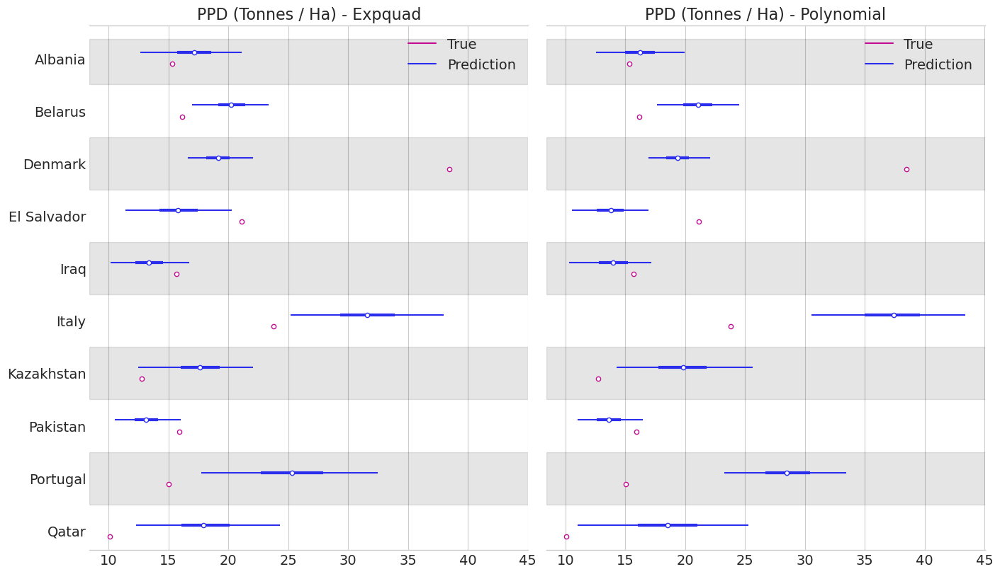

In [17]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='PPD (Tonnes / Ha) - Expquad')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='PPD (Tonnes / Ha) - Polynomial')
plt.show()

[]

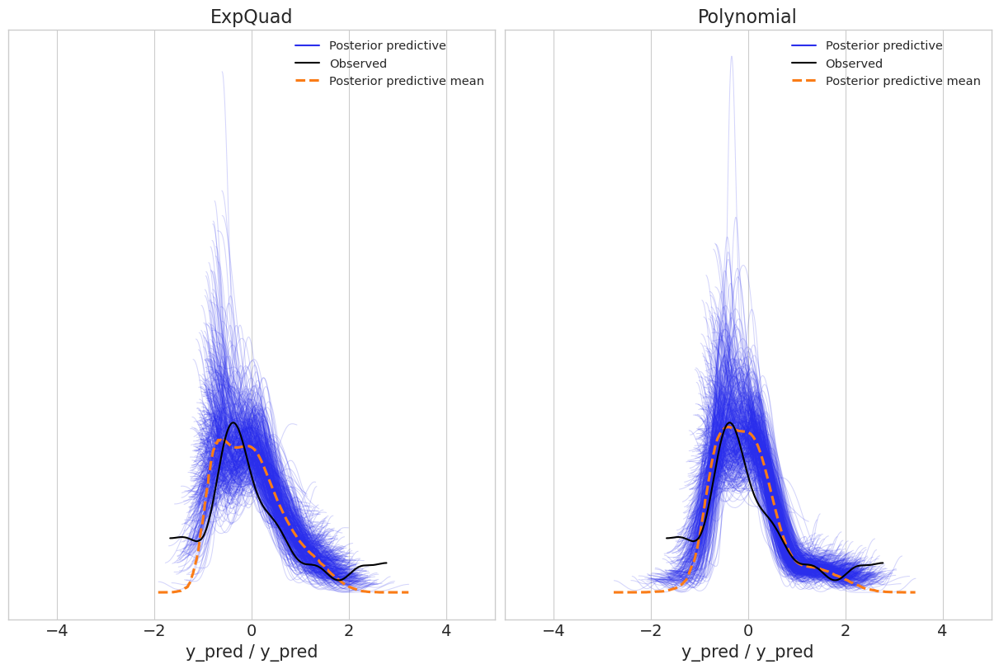

In [27]:
fig, (ax1, ax2) = plt.subplots(ncols=2,figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('ExpQuad')
ax2.set_title('Polynomial')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

In [30]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("ExpQuad    MAE: {:.4f} (Tonnes / Ha)".format(results['expquad2']['mae'] * 1e-4))
print("Polynomial MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

ExpQuad    MAE: 5.1382 (Tonnes / Ha)
Polynomial MAE: 5.5212 (Tonnes / Ha)


<font size=5>
Higher error on puntual values
    <br><br>

In [22]:
results['poly'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

<br><br><br>
### Grade 3
<font size=5>
Same model, except we try grade 3 polynomial

In [119]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    offset = pm.Normal('offset', 0, 0.5)
    c = pm.Normal('c', 0, 0.5, shape=n_features)
    grade = 3
    # Instantiate the covariance function
    cov = pm.gp.cov.Polynomial(n_features, c=c, d=grade, offset=offset) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)

In [45]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.95
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, offset]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 977 seconds.
There were 5969 divergences after tuning. Increase `target_accept` or reparameterize.
There were 10267 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 25% for some parameters.


<font size=5>
As expected, results to be even more unstable
    <br><br>

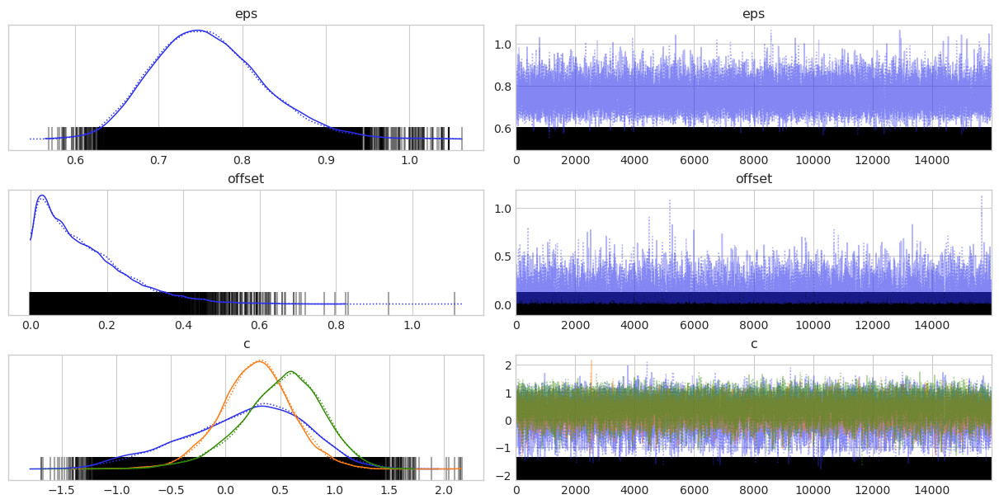

In [46]:
plot_trace(trace, ['eps', 'offset', 'c'])

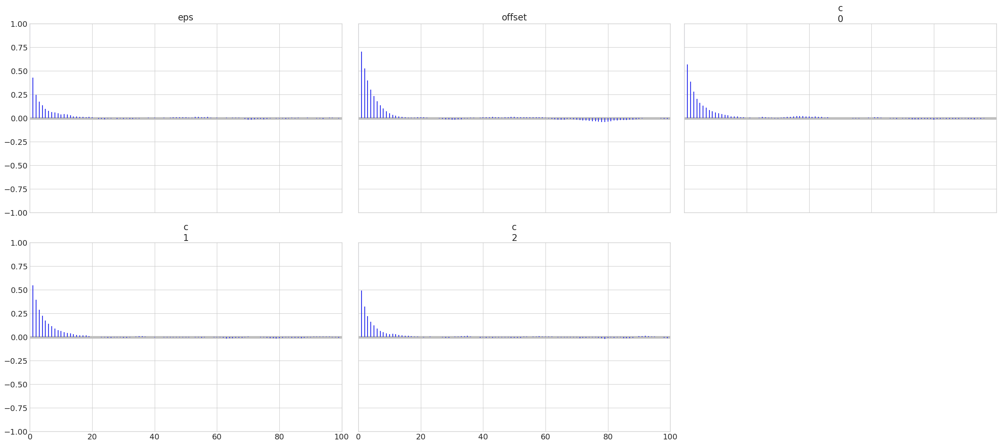

In [17]:
az.plot_autocorr(trace, var_names=['eps', 'offset', 'c'], combined=True)
plt.show()

In [125]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

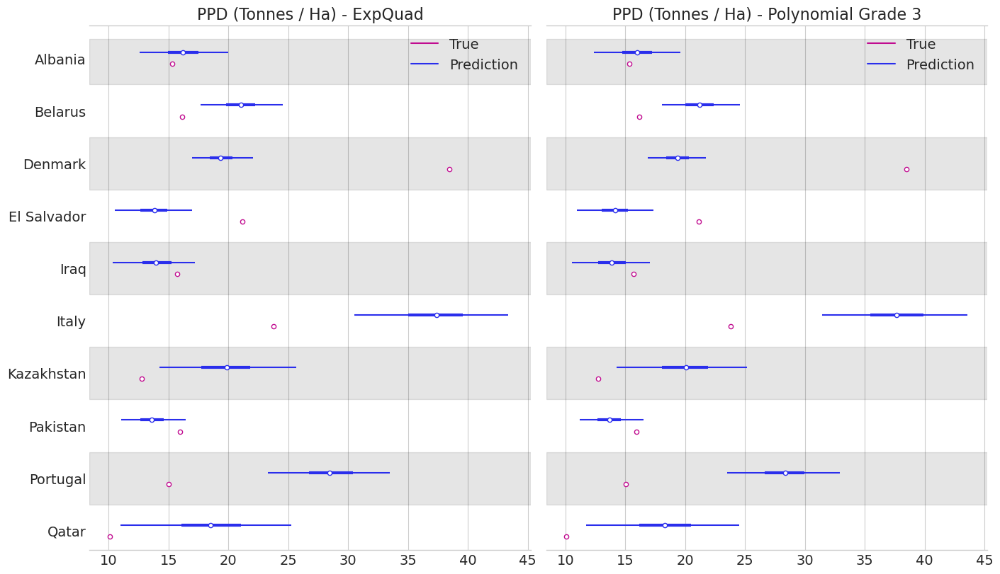

In [30]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['poly']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='PPD (Tonnes / Ha) - ExpQuad')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='PPD (Tonnes / Ha) - Polynomial Grade 3')
plt.show()

<font size=5>
Distribution seems to be very similar to grade 2
<br>
<br>

In [32]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("Grade 2 MAE: {:.4f} (Tonnes / Ha)".format(results['poly']['mae'] * 1e-4))
print("Grade 3 MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

Grade 2 MAE: 5.5212 (Tonnes / Ha)
Grade 3 MAE: 5.5008 (Tonnes / Ha)


In [129]:
results['poly3'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### Polynomial kernel on a trivial function
<font size=5>
$$
fun(x) = x^3 - 7x^2 - 2x + 10
$$
Let's see if, we are able to fit a Gaussian process with polynomial kernel at least on a simple function
    <br>
Thus, we can see if the problem is related to the model or the data

In [32]:
fun = lambda x: x**3 - 7*x**2 - 2*x + 10
fun = np.vectorize(fun)

In [33]:
x_fun = np.linspace(-10, 10, 100)

In [34]:
y_fun = fun(x_fun)

In [35]:
x_std_fun, x_mean_fun, x_stddev_fun = standardize_data(x_fun)
y_std_fun, y_mean_fun, y_stddev_fun = standardize_data(y_fun)

<font size=5>
Gaussian Noise on y

In [36]:
y_std_noise = y_std_fun + np.random.normal(0,0.1,100)

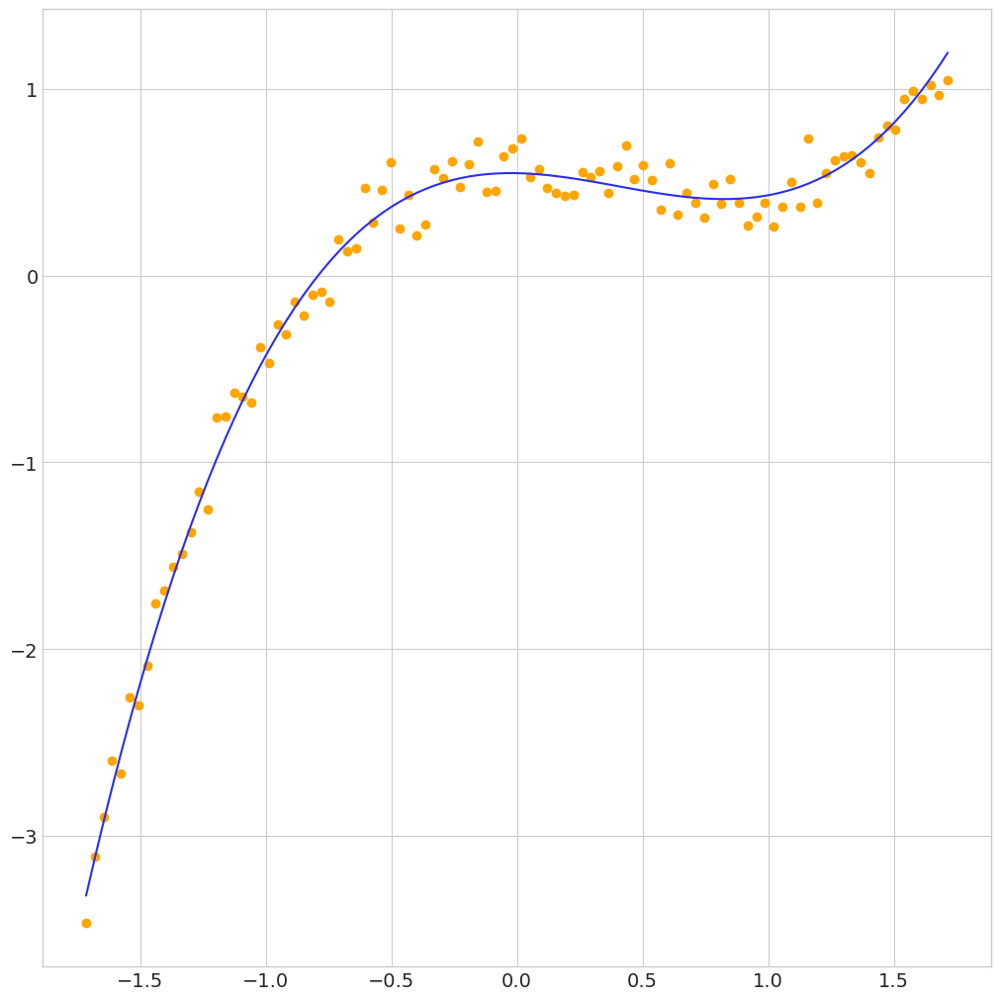

In [43]:
plt.figure(figsize=(10, 10))
plt.plot(x_std_fun, y_std_fun)
plt.scatter(x_std_fun, y_std_noise, c='orange')
plt.show()

In [41]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    offset = pm.Normal('offset', 0, 0.5)
    c = pm.Normal('c', 0, 0.5)
    grade = 3
    # Instantiate the covariance function
    cov = pm.gp.cov.Polynomial(1, c=c, d=grade, offset=offset) + pm.gp.cov.WhiteNoise(1e-4)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=np.expand_dims(x_std_fun, axis=1), y=y_std_noise, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [42]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=8000, tune=4000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
        target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, offset]


Sampling 2 chains for 4_000 tune and 8_000 draw iterations (8_000 + 16_000 draws total) took 213 seconds.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.
There were 8 divergences after tuning. Increase `target_accept` or reparameterize.


<font size=5>
Still have some divergences despite higher target_accept and parameter tuning

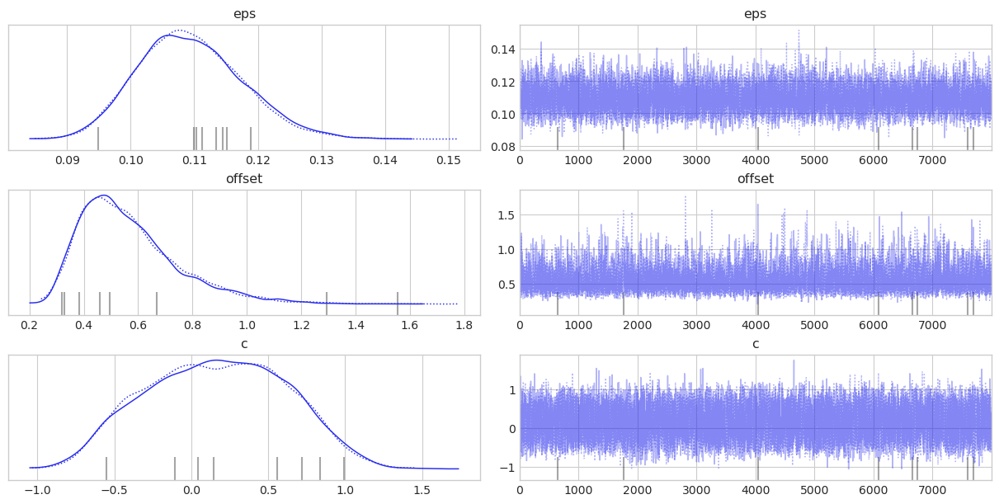

In [44]:
plot_trace(trace, ['eps', 'offset', 'c'])

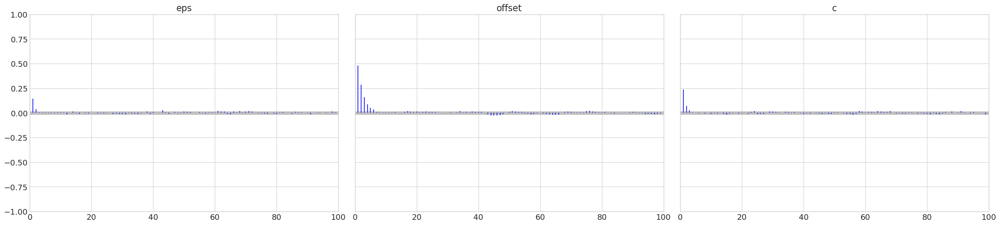

In [45]:
az.plot_autocorr(trace, var_names=['eps', 'offset', 'c'], combined=True)
plt.show()

In [46]:
x_new = (np.random.rand(100) * 3) - 1.5
y_new = gp_model.sample_conditional(trace, np.expand_dims(x_new, axis=1), 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


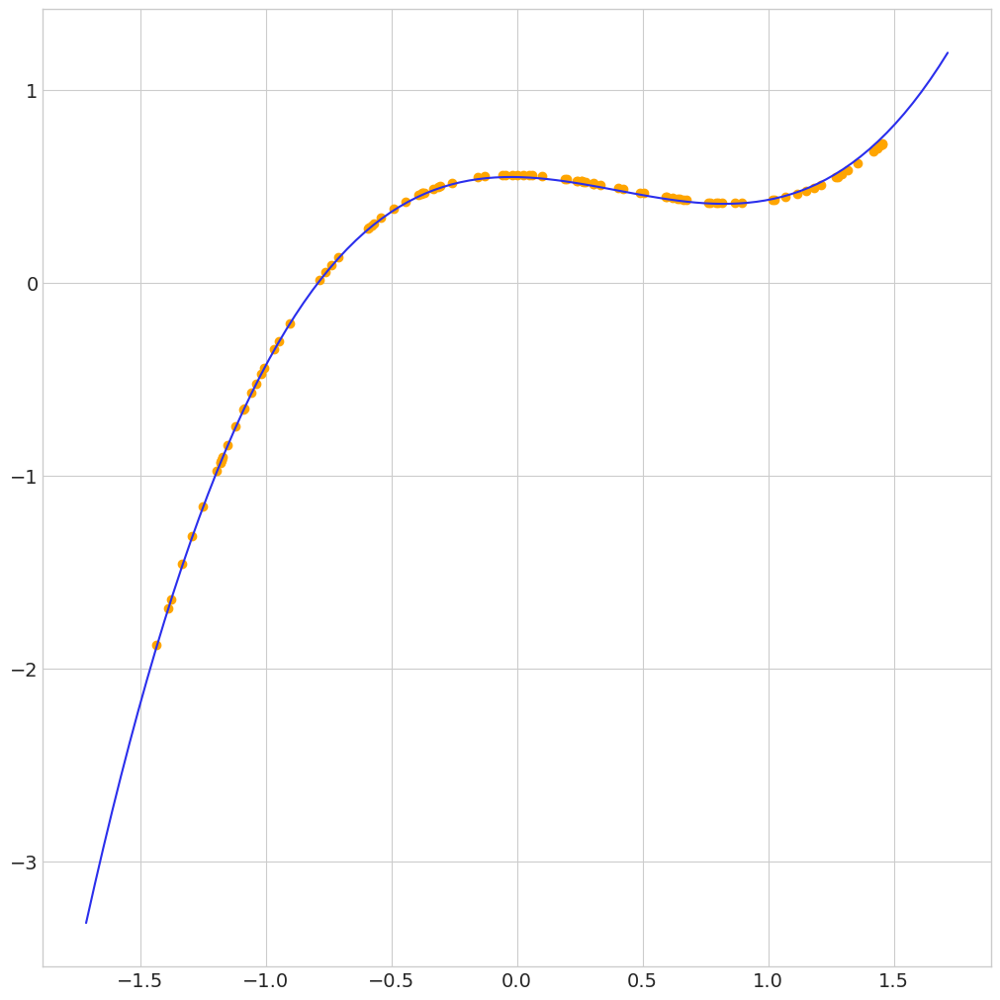

In [47]:
plt.figure(figsize=(10, 10))
plt.plot(x_std_fun, y_std_fun)
plt.scatter(x_new, np.median(y_new, axis=0), c='orange')
plt.show()

## Exponential Kernel

<font size=5>
Similar to Exponential Quadratic, but without the square
$$
\phi(x,x') = \exp \left( -\frac{||x-x'||}{2\ell^2} \right)
$$

In [71]:
def covariance_matrix(x, kf, **kwargs):
    x1 = np.expand_dims(x, axis=0)
    x2 = np.expand_dims(x, axis=1)
    return kf(x1, x2, **kwargs)

def gp_sample(kf, xmin=-4.0, xmax=4.0, n_samples=150, return_cov=False, **kwargs):
    x = np.linspace(xmin, xmax, n_samples)
    m = np.zeros(n_samples)
    if not return_cov:
        k = covariance_matrix(x, kf, **kwargs)
    else:
        x1 = np.expand_dims(x, axis=1)
        k = kf(x1, x1, **kwargs)
    y = np.random.multivariate_normal(mean=m, cov=k)
    return x, y, k

def plot_gp_sample(name, kf, kwargs_ls, n_functions=3, return_cov=False, multicol=1, col=0, subplots=None):
    np.random.seed(42)
    ls_kwargs = [dict(zip(kwargs_ls, v)) for v in zip(*kwargs_ls.values())]
    plt.rcParams['axes.grid'] = False
    ncols = 2 * multicol
    if col == 0:
        fig, axs = plt.subplots(nrows=len(ls_kwargs), ncols=ncols, figsize=(15, 3.5 * len(ls_kwargs)))
    else:
        fig, axs = subplots
    if len(ls_kwargs) == 1:
        kwargs = ls_kwargs[0]
        axs[col * 2].set_title('{} {}'.format(name, kwargs))
        for k in range(n_functions):
            x, y, k = gp_sample(kf, return_cov=return_cov, **kwargs)
            axs[col * 2].plot(x, y)
        axs[2 * col + 1].xaxis.tick_top()
        axs[2 * col + 1].set_xticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
        axs[2 * col + 1].set_yticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
        axs[2 * col + 1].invert_yaxis()
        im = axs[2 * col + 1].imshow(k, interpolation='antialiased')
        plt.colorbar(im, ax=axs[2 * col + 1]) 
    else:
        for i, kwargs in enumerate(ls_kwargs):
            axs[i, col * 2].set_title('{} {}'.format(name, kwargs))
            for k in range(n_functions):
                x, y, k = gp_sample(kf, return_cov=return_cov, **kwargs)
                axs[i, col * 2].plot(x, y)
            axs[i, 2 * col + 1].xaxis.tick_top()
            axs[i, 2 * col + 1].set_xticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
            axs[i, 2 * col + 1].set_yticks([0, len(k) - 1], labels=[0, '{}'.format(len(k))])
            axs[i, 2 * col + 1].invert_yaxis()
            im = axs[i, 2 * col + 1].imshow(k, interpolation='antialiased')
            plt.colorbar(im, ax=axs[i, 2 * col + 1])
    fig.tight_layout()
    return fig, axs
    
def kernel_expquad(x1, x2, l): return np.exp(-((x1 - x2) ** 2.0) / (2 * l ** 2.0))
def kernel_exp(x1, x2, l): return np.exp(-np.abs(x1 - x2) / (2 * l ** 2.0))

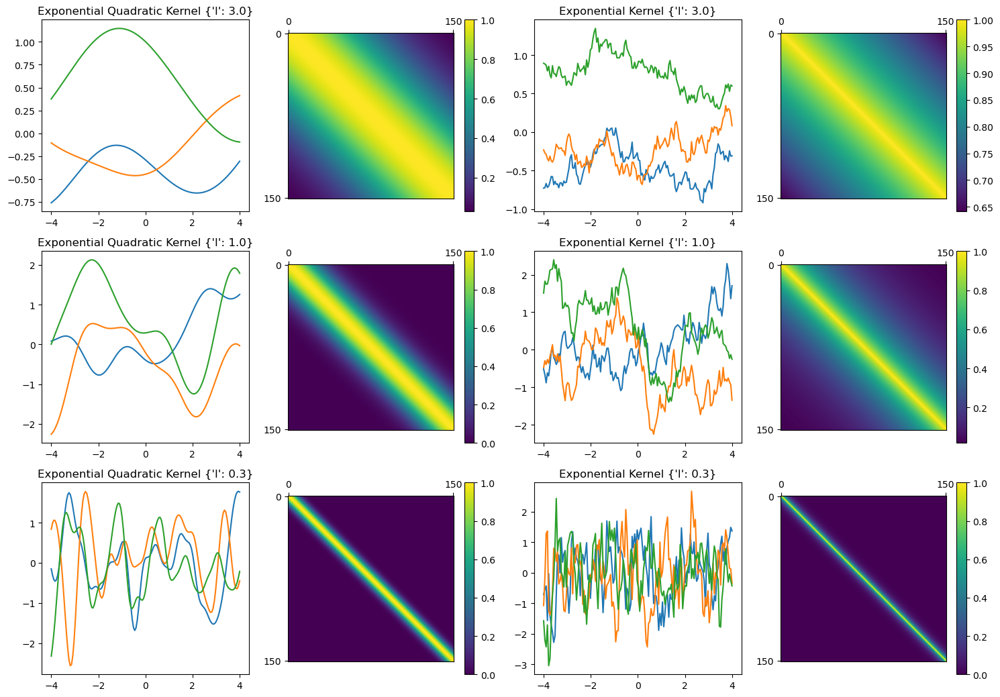

In [89]:
with plt.style.context('default'):
    subplots = plot_gp_sample("Exponential Quadratic Kernel", kernel_expquad, kwargs_ls={'l': [3.0, 1.0, 0.3]}, multicol=2, col=0)
    plot_gp_sample("Exponential Kernel", kernel_exp, kwargs_ls={'l': [3.0, 1.0, 0.3]}, multicol=2, col=1, subplots=subplots)
    plt.show()

<font size=5>
Results to be less smooth
<br><br><br>
    
We'll use the same model as ExpQuad

In [130]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [60]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 596 seconds.


<font size=5>
Conmparison of posteriors: <br>
Exponential kernel:

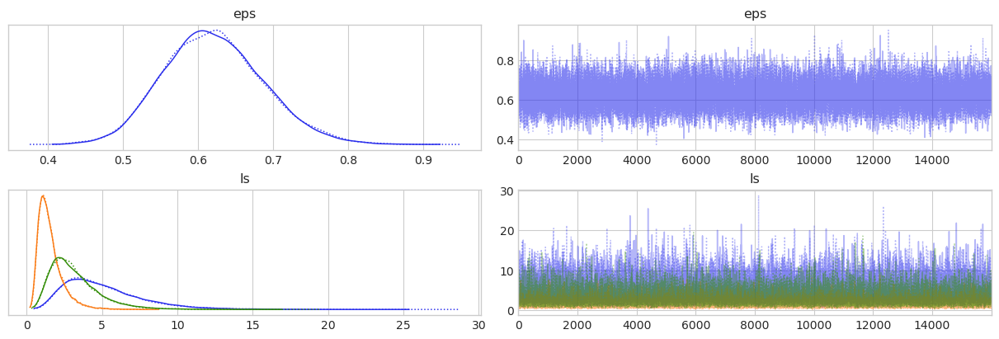

In [61]:
plot_trace(trace, ['eps', 'ls'])

<font size=5>
ExpQuad kernel: <br>

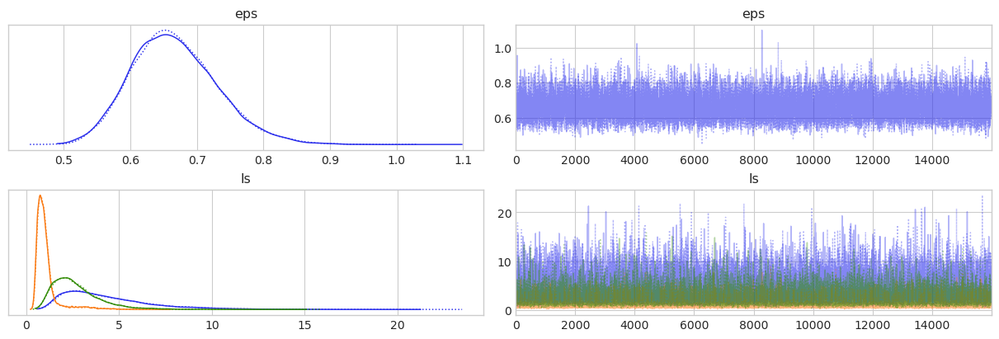

In [62]:
plot_trace(results['expquad2']['trace'], ['eps', 'ls'])

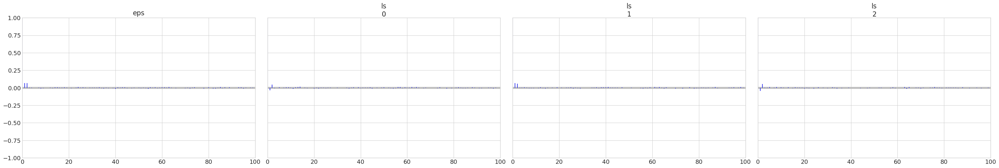

In [63]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [132]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


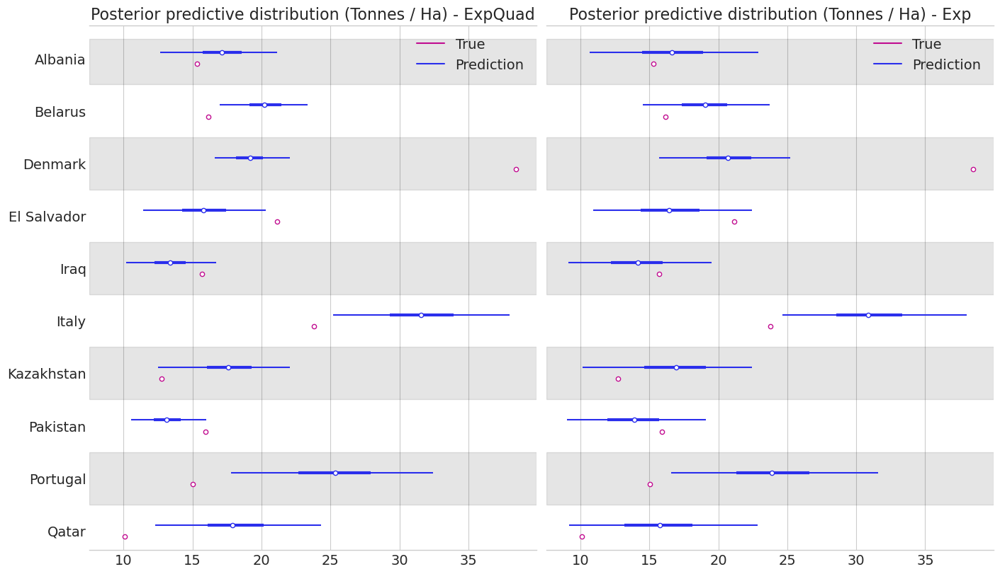

In [133]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - ExpQuad')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - Exp')
plt.show()

[]

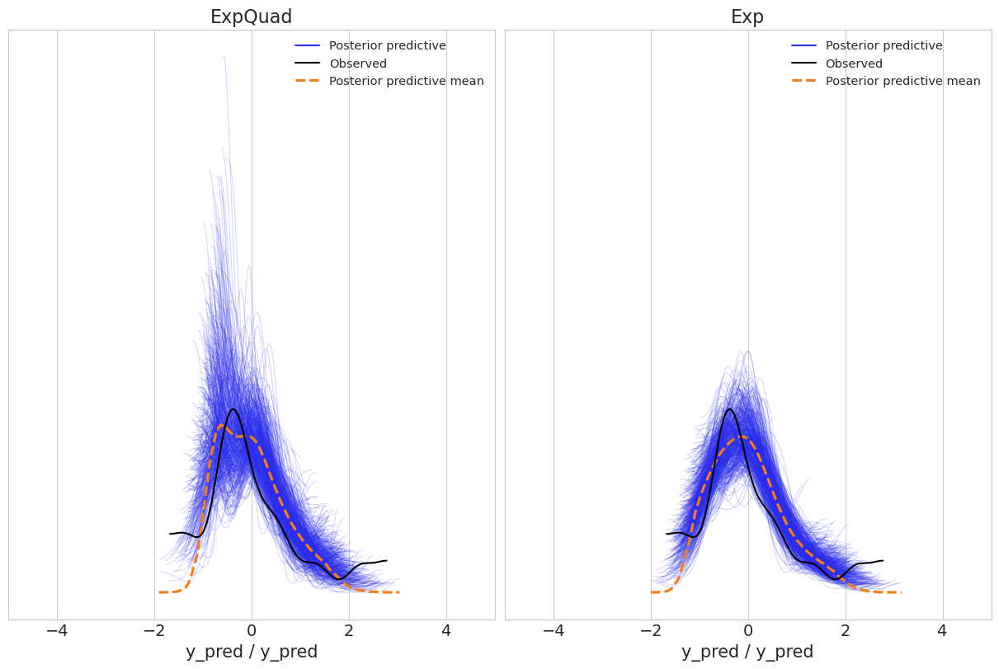

In [185]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('ExpQuad')
ax2.set_title('Exp')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred': results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

In [36]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("ExpQuad MAE: {:.4f} (Tonnes / Ha)".format(results['expquad2']['mae'] * 1e-4))
print("Exp     MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

ExpQuad MAE: 5.1382 (Tonnes / Ha)
Exp     MAE: 4.3715 (Tonnes / Ha)


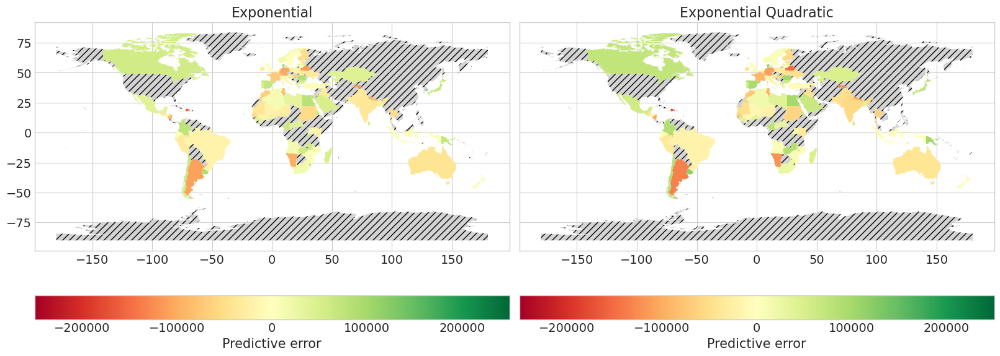

In [137]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 10), sharex=True, sharey=True)
ax1.set_title('Exponential')
ax2.set_title('Exponential Quadratic')
world_error_plot(world, results['expquad2']['pred_samples'], y_mean, y_stddev, y_data, axes=ax2, max_error=250_000)
world_error_plot(world, pred_samples, y_mean, y_stddev, y_data, axes=ax1, max_error=250_000)

<font size=5>
Errors on same countries, just a little bit less <br>

In [138]:
results['exp'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Rational Quadratic Kernel

<font size=5>
$$
\phi(x,x') = \exp \left(1 + \frac{||x-x'||^2}{2\ell^2} \right)^{-\alpha}
$$
    
- Generalization of ExpQuad kernel <br>
- It can be seen as an infinite sum of ExpQuads kernels with differen length scales
- It is equal to ExpQuad for $\alpha \to \inf$ <br>

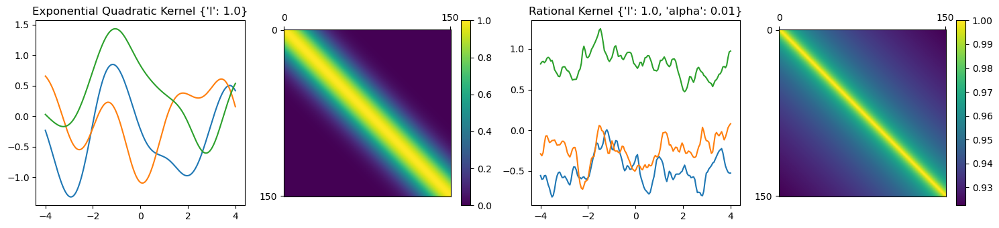

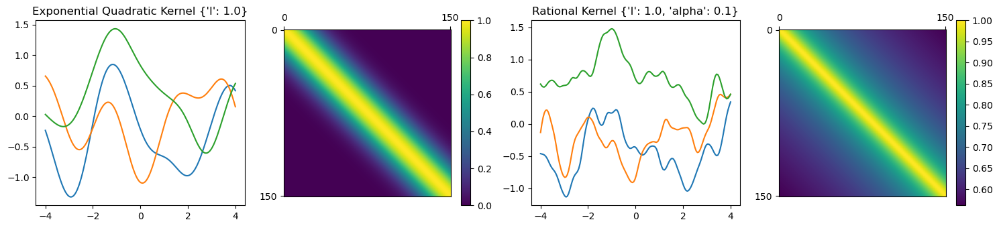

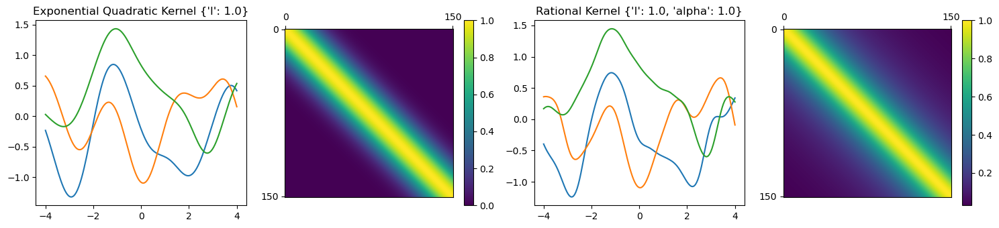

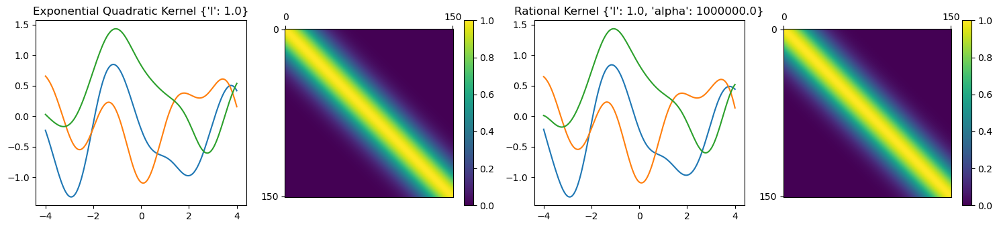

In [72]:
def kernel_ratquad(x, y, l, alpha): return (1 + ((x - y)**2)/(2*alpha*l**2))**-alpha
args = [
    ({'l': [1.0]}, {'alpha': [0.01]}),
    ({'l': [1.0]}, {'alpha': [0.1]}),
    ({'l': [1.0]}, {'alpha': [1.0]}),
    ({'l': [1.0]}, {'alpha': [1000000.0]}),
]
with plt.style.context('default'):
    for arg in args:
        subplots = plot_gp_sample("Exponential Quadratic Kernel", kernel_expquad, kwargs_ls=arg[0], multicol=2, col=0)
        plot_gp_sample("Rational Kernel", kernel_ratquad, kwargs_ls={**arg[0], **arg[1]}, multicol=2, col=1, subplots=subplots)
        plt.show()

<font size=5>
    <br><br>
Increased target accept to 0.95 as there was multiple divergences. <br>
Can be due to the additional parameter

In [58]:
#### Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.HalfNormal('ls', 0.5, shape=n_features)
    alpha = pm.Gamma('alpha', 2.0, 0.5)
    # Instantiate the covariance function
    cov = pm.gp.cov.RatQuad(n_features, ls=ls, alpha=alpha) + pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [59]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.95
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, alpha, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1760 seconds.


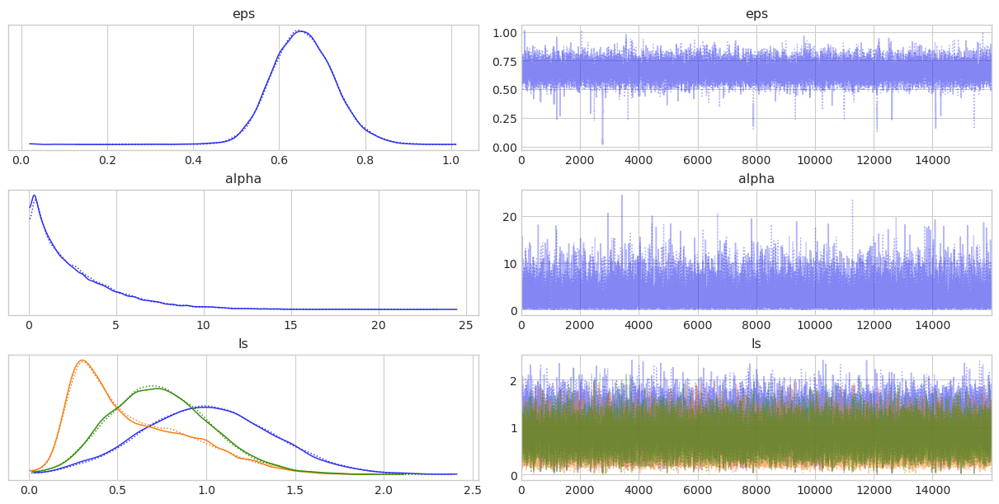

In [60]:
plot_trace(trace, ['eps', 'alpha', 'ls'])

In [61]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


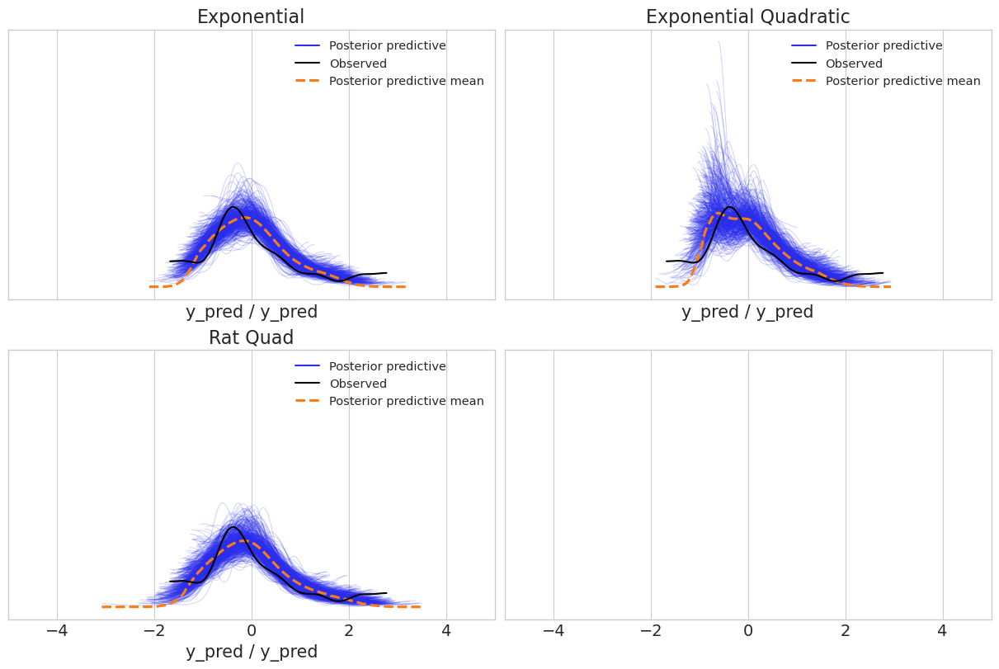

In [62]:
fig, ((ax1, ax2), (ax3, _)) = plt.subplots(ncols=2, nrows=2, figsize=(12, 8), sharex=True, sharey=True)
ax1.set_title('Exponential')
ax2.set_title('Exponential Quadratic')
ax3.set_title('Rat Quad')
ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['expquad2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax2.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax3)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

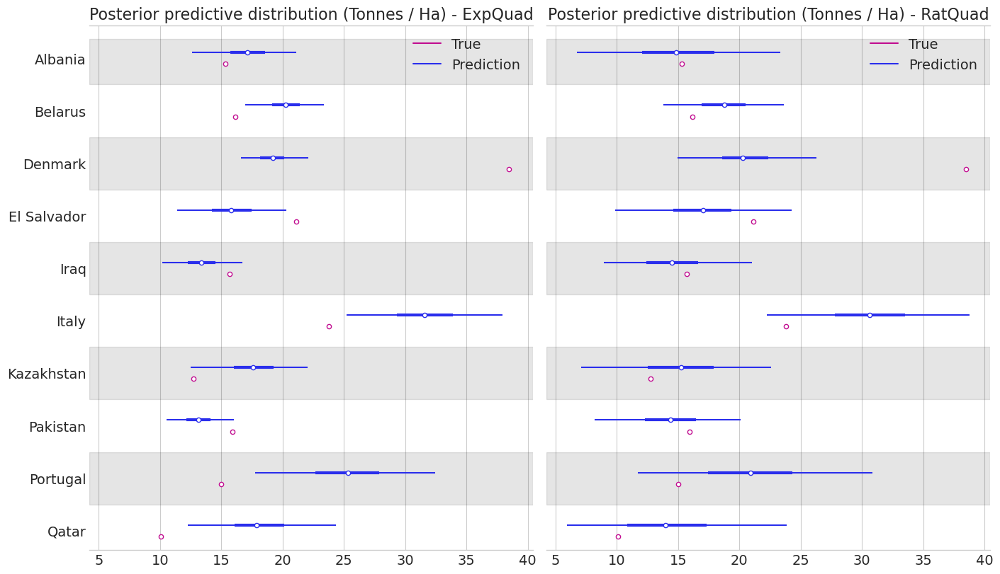

In [12]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['expquad2']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - ExpQuad')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - RatQuad')
plt.show()

In [39]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("ExpQuad MAE: {:.4f} (Tonnes / Ha)".format(results['expquad2']['mae'] * 1e-4))
print("Exp     MAE: {:.4f} (Tonnes / Ha)".format(results['exp']['mae'] * 1e-4))
print("RatQuad MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

ExpQuad MAE: 5.1382 (Tonnes / Ha)
Exp     MAE: 4.3715 (Tonnes / Ha)
RatQuad MAE: 3.9216 (Tonnes / Ha)


<font size=5>
Major flexibility has allowed us to reach better results and catch more uncertainty

In [66]:
results['rat'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Combyning kernels

### Summing
<font size=5>
Summing kernels can be interpreted as a logical OR, value is high when at least one is high

In [139]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) + \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [84]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1072 seconds.


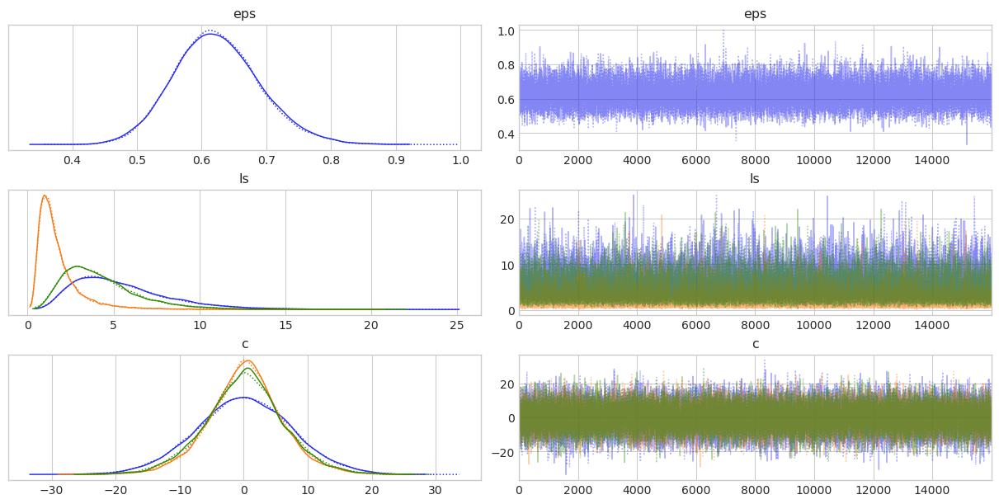

In [85]:
plot_trace(trace, ['eps', 'ls', 'c'])

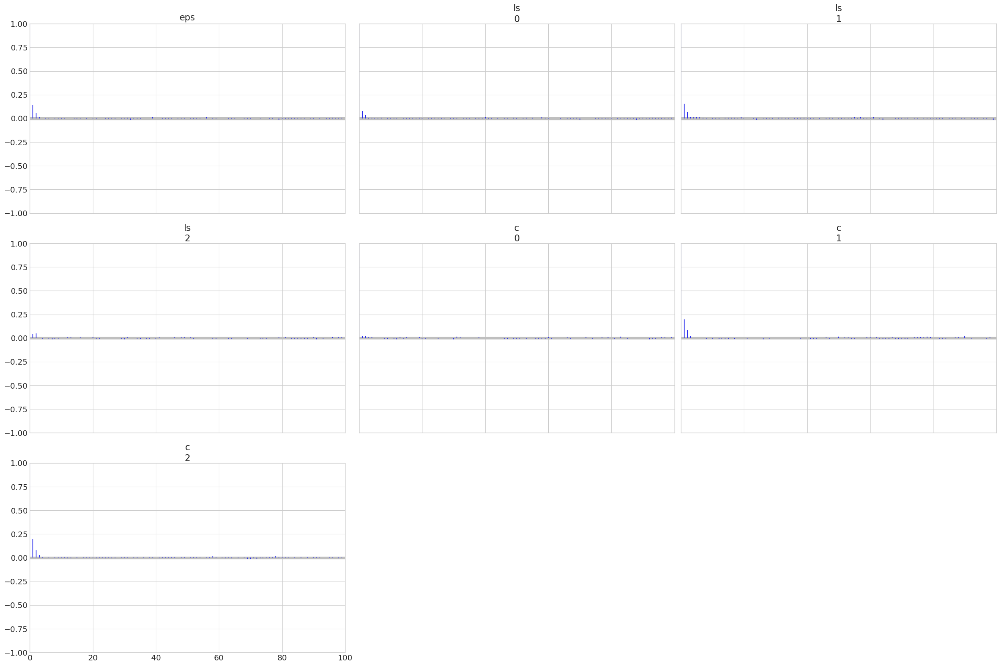

In [86]:
az.plot_autocorr(trace, var_names=['eps', 'ls', 'c'], combined=True)
plt.show()

In [146]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

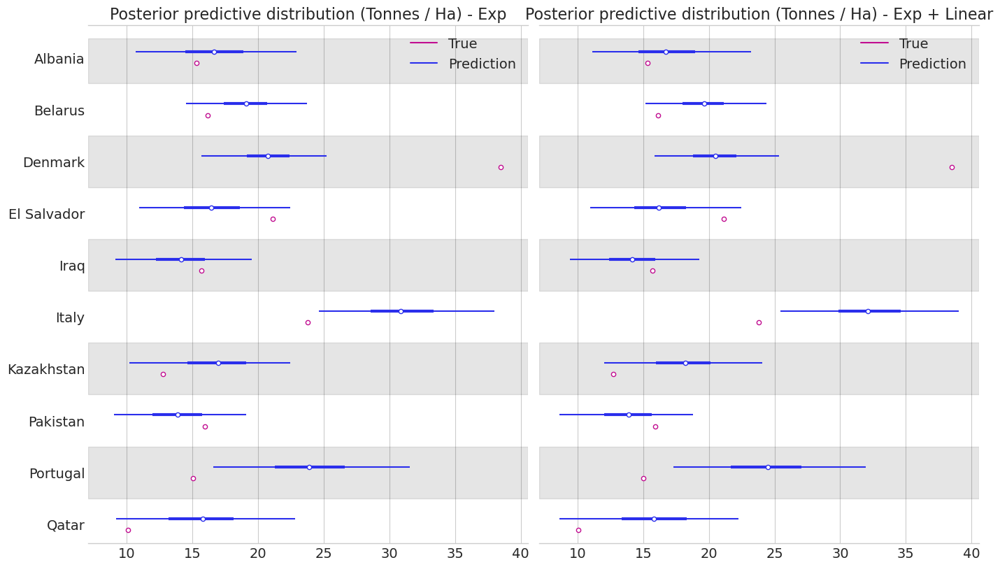

In [147]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['exp']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='Posterior predictive distribution (Tonnes / Ha) - Exp')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='Posterior predictive distribution (Tonnes / Ha) - Exp + Linear')
plt.show()

<font size=5>
Adding linear kernel seems to not have done any effect at all
    <br><br>

In [42]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("Exp MAE: {:.4f} (Tonnes / Ha)".format(results['exp']['mae'] * 1e-4))
print("Sum MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

Exp MAE: 4.3715 (Tonnes / Ha)
Sum MAE: 4.4168 (Tonnes / Ha)


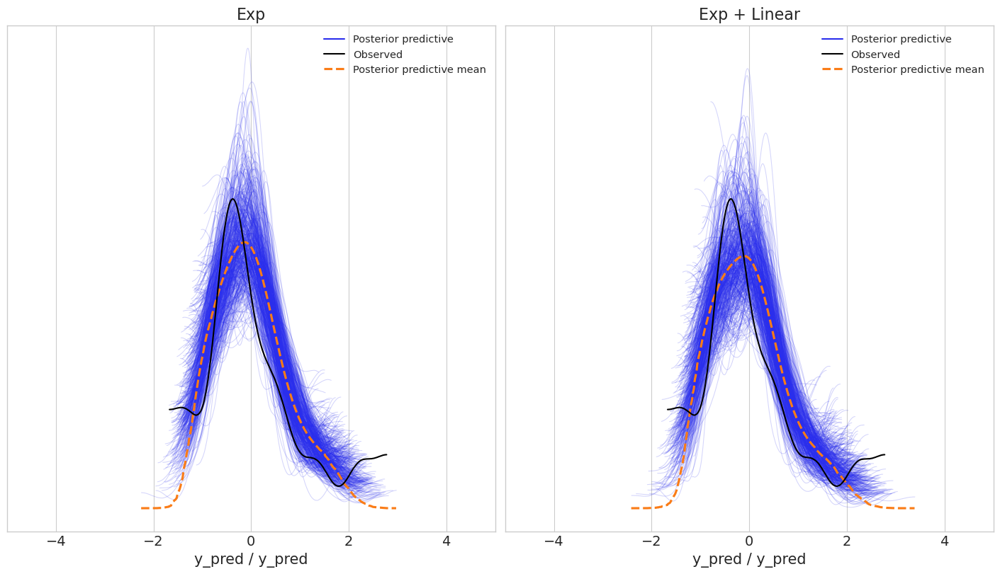

In [173]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('Exp')
ax2.set_title('Exp + Linear')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [151]:
results['exp_linear_sum'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### Weighted sum
<font size=5>
We can put weights on the kernels to see the importances

In [154]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    w0 = pm.HalfNormal('w0', 5)
    w1 = pm.HalfNormal('w1', 5)
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * w0 + \
        pm.gp.cov.Linear(n_features, c=c) * w1 + \
        pm.gp.cov.WhiteNoise(1e-5) 
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [94]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True, target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, w1, w0, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1540 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.


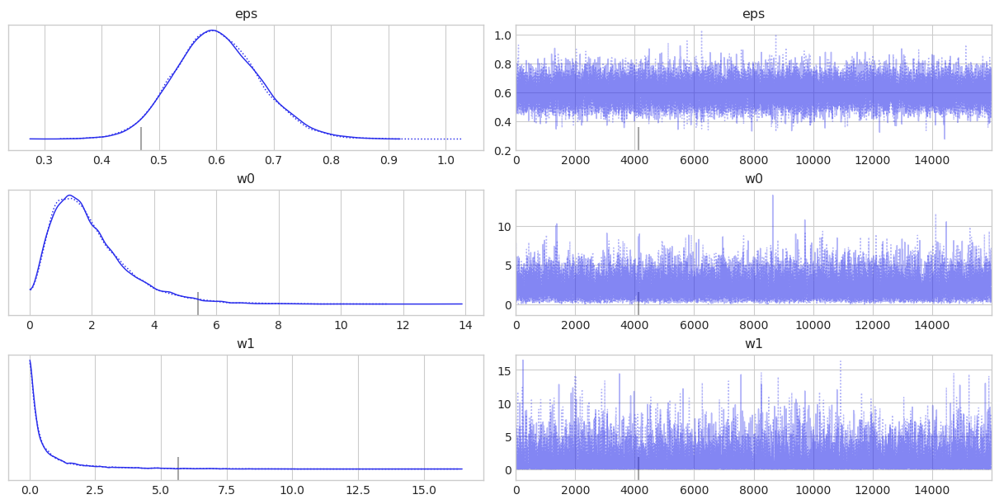

In [95]:
plot_trace(trace, ['eps', 'w0', 'w1'])

<font size=5>
    Weight of Linear kernel approaches to 0
    <br><br>

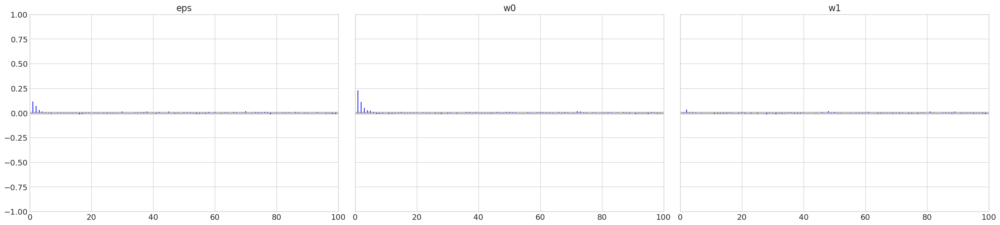

In [96]:
az.plot_autocorr(trace, var_names=['eps', 'w0', 'w1'], combined=True)
plt.show()

In [155]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


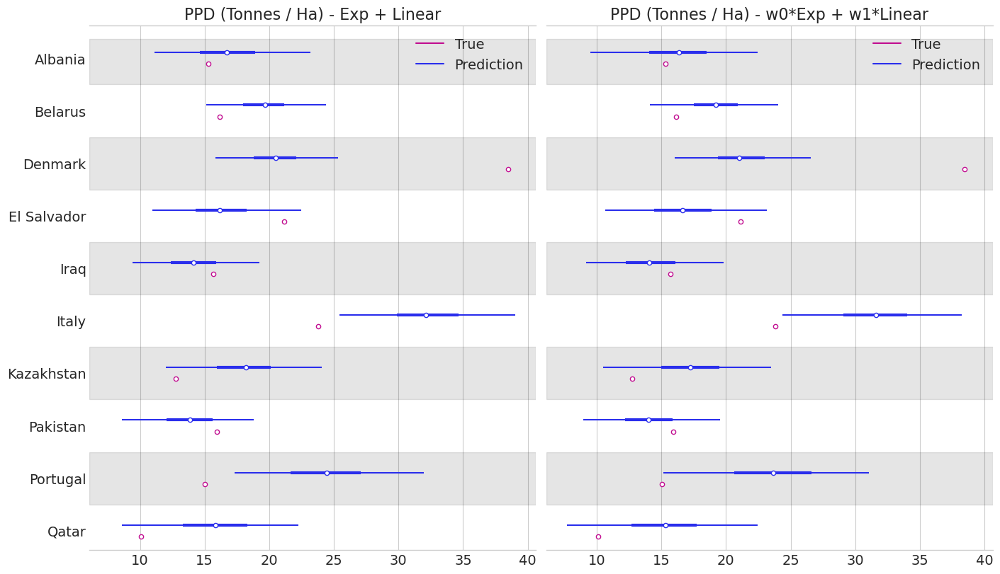

In [156]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['exp_linear_sum']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='PPD (Tonnes / Ha) - Exp + Linear')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='PPD (Tonnes / Ha) - w0*Exp + w1*Linear')
plt.show()

In [44]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("Exp          MAE: {:.4f} (Tonnes / Ha)".format(results['exp']['mae'] * 1e-4))
print("Sum          MAE: {:.4f} (Tonnes / Ha)".format(results['exp_linear_sum']['mae'] * 1e-4))
print("Weighted sum MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

Exp          MAE: 4.3715 (Tonnes / Ha)
Sum          MAE: 4.4168 (Tonnes / Ha)
Weighted sum MAE: 4.1534 (Tonnes / Ha)


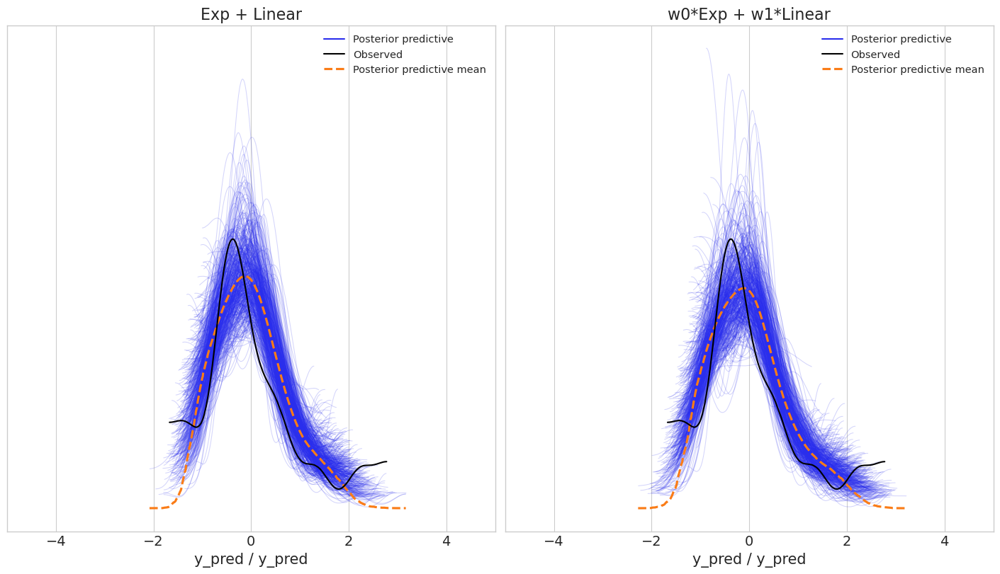

In [171]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('Exp + Linear')
ax2.set_title('w0*Exp + w1*Linear')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [160]:
results['exp_linear_weighted'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

### Multiplying
<font size=5>
Multiplying kernels can be interpreted as a logical AND, value is high when both are high 

In [161]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [104]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1059 seconds.
There were 8 divergences after tuning. Increase `target_accept` or reparameterize.


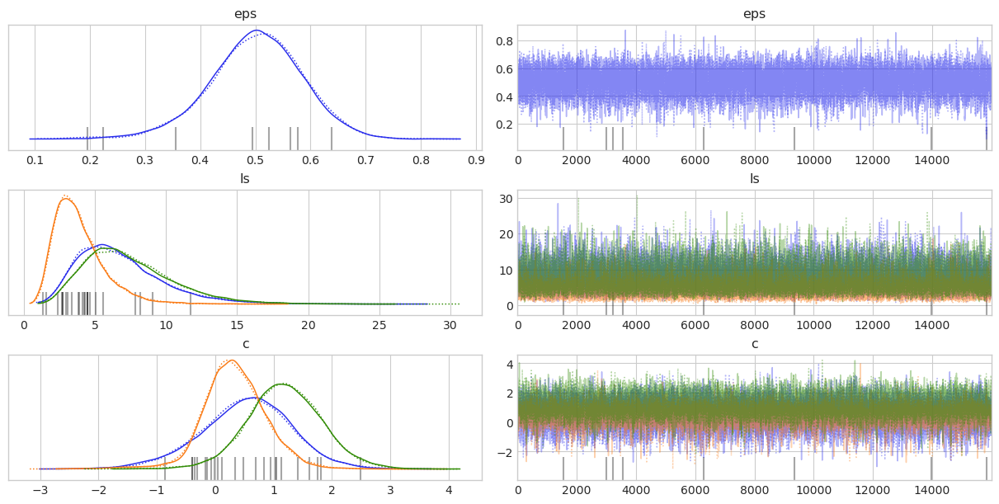

In [105]:
plot_trace(trace, ['eps', 'ls', 'c'])

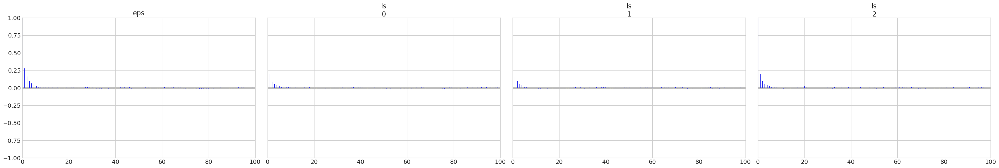

In [106]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [163]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


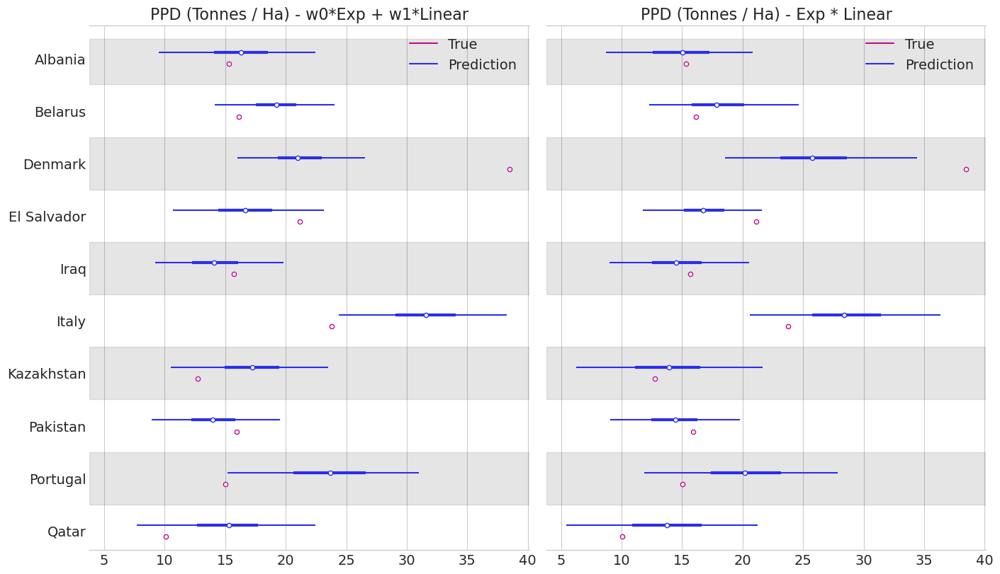

In [164]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['exp_linear_weighted']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='PPD (Tonnes / Ha) - w0*Exp + w1*Linear')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='PPD (Tonnes / Ha) - Exp * Linear')
plt.show()

In [47]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("ExpQuad  MAE: {:.4f} (Tonnes / Ha)".format(results['expquad2']['mae'] * 1e-4))
print("Exp      MAE: {:.4f} (Tonnes / Ha)".format(results['exp']['mae'] * 1e-4))
print("RatQuad  MAE: {:.4f} (Tonnes / Ha)".format(results['rat']['mae'] * 1e-4))
print("Sum      MAE: {:.4f} (Tonnes / Ha)".format(results['exp_linear_sum']['mae'] * 1e-4))
print("Weighted MAE: {:.4f} (Tonnes / Ha)".format(results['exp_linear_weighted']['mae'] * 1e-4))    
print("Mul      MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

ExpQuad  MAE: 5.1382 (Tonnes / Ha)
Exp      MAE: 4.3715 (Tonnes / Ha)
RatQuad  MAE: 3.9216 (Tonnes / Ha)
Sum      MAE: 4.4168 (Tonnes / Ha)
Weighted MAE: 4.1534 (Tonnes / Ha)
Mul      MAE: 2.9956 (Tonnes / Ha)


<font size=5>
Surprising low error with this two kernels multiplied;
    
There is no a real interpretation, but as said, combyining kernels can catch better relations between points

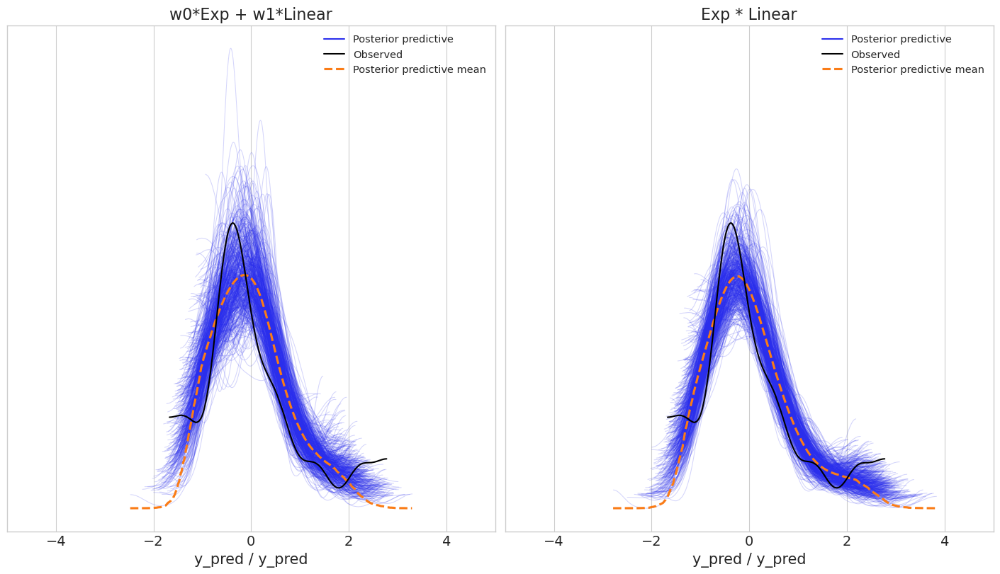

In [169]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('w0*Exp + w1*Linear')
ax2.set_title('Exp * Linear')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp_linear_weighted']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [168]:
results['exp_linear_mul'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## All features
<font size=5>
Let's try now considering all the features

### Realoding dataset without removing features

In [25]:
# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)
cy = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)

# Get geodata for plot world map
countries = cy['Area'].unique()
world = get_geodata(countries)

# Get the features and the target feature
cy = cy.drop('Area', axis=1)
print(cy.describe())
x_data = cy.drop('hg/ha_yield', axis=1).to_numpy()
y_data = cy['hg/ha_yield'].to_numpy()

# Set the indices of the sample for testing
num_test_results = 10
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)
train_indices = np.array([i for i in range(len(y_data)) if i not in test_indices])

# Standardize the data
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

# Get 10 samples to plot
x_test_std_data, y_test_std_data = x_std_data[test_indices], y_std_data[test_indices]

y_data_full = y_data.copy()
x_test_data, y_test_data = x_data[test_indices], y_data[test_indices]

n_samples, n_features = x_std_data.shape
x_std_data.shape, y_std_data.shape, x_test_std_data.shape, y_test_std_data.shape

         hg/ha_yield  avg_rain_mm_per_year  pesticides_kg_per_ha   avg_temp  \
count      95.000000             95.000000             95.000000  95.000000   
mean   181841.413334           1019.326316              3.143013  17.850083   
std     96668.731420            696.800613              4.049940   7.388661   
min     20516.217391             51.000000              0.003028   3.459565   
25%    127517.738095            577.000000              0.217843  10.646667   
50%    160965.434783            788.000000              1.590888  18.163478   
75%    224914.108696           1492.500000              4.085821  24.843652   
max    448891.538462           3240.000000             20.888427  29.718696   

             lat         lon         elev  
count  95.000000   95.000000    95.000000  
mean   21.398688   15.279380   637.568421  
std    27.141268   54.357624   586.573509  
min   -41.000000 -102.000000    28.000000  
25%     2.500000   -3.000000   297.500000  
50%    25.000000   20.00

((95, 6), (95,), (10, 6), (10,))

### Rebuild the model
<font size=5>
Same model as the last one, with <i>Exponential * Linear</i>

In [188]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [129]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
        target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 2047 seconds.


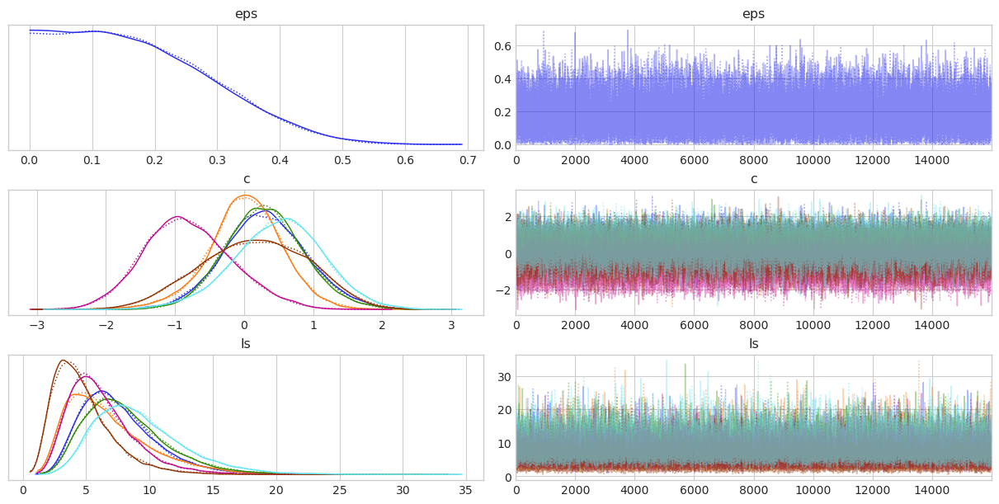

In [18]:
plot_trace(trace, ['eps', 'c', 'ls'])

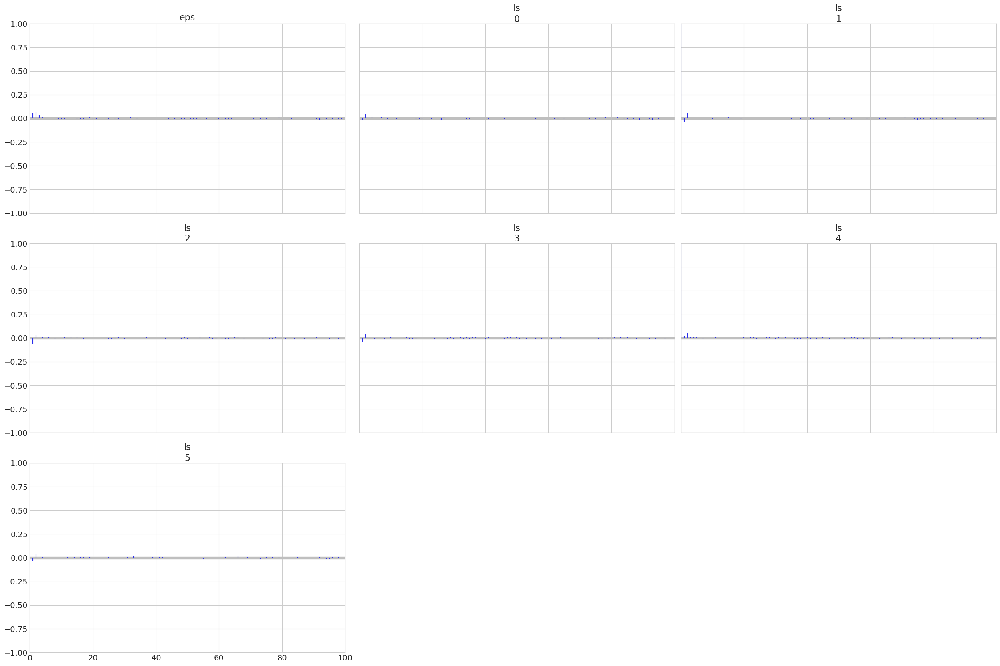

In [131]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [189]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


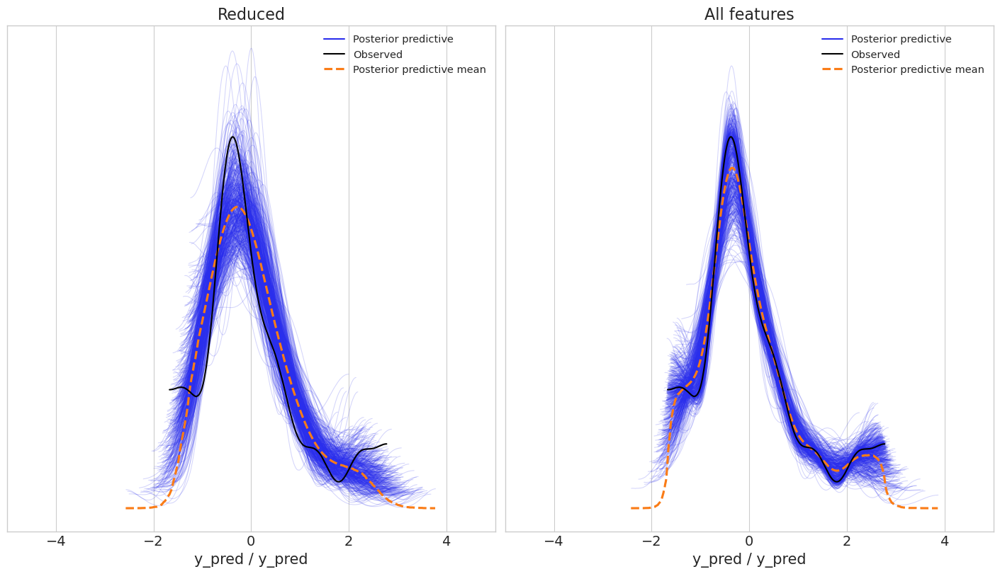

In [190]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('All data')
ax2.set_title('All features')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['exp_linear_mul']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

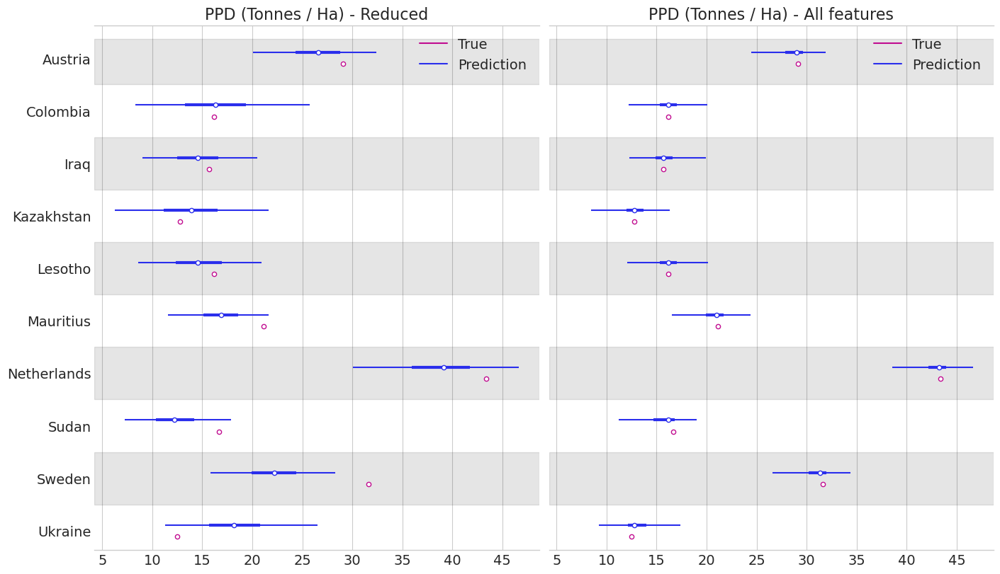

In [191]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
plot_test(results['exp_linear_mul']['pred_samples'][:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax1, title='PPD (Tonnes / Ha) - Reduced')
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices], axes=ax2, title='PPD (Tonnes / Ha) - All features')
plt.show()

<font size=5>
Despite the Linear model has weighted little the other features, <br>Gaussian Processes had well handled that information and dropped the error with them

In [50]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("Reduced MAE: {:.4f} (Tonnes / Ha)".format(results['exp_linear_mul']['mae'] * 1e-4))
print("All     MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

Reduced MAE: 2.9956 (Tonnes / Ha)
All     MAE: 0.1619 (Tonnes / Ha)


In [194]:
results['all_exp_linear'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

In [ ]:
world_error_plot(world, results['all_exp_linear']['pred_samples'], y_mean, y_stddev, y_data)
plt.savefig("images/gp_errmap.png", dpi=192)

### More samples
<font size=5>
Check if we need more samples with more features

In [195]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [141]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=32_000, tune=16_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
        target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 16_000 tune and 32_000 draw iterations (32_000 + 64_000 draws total) took 4168 seconds.


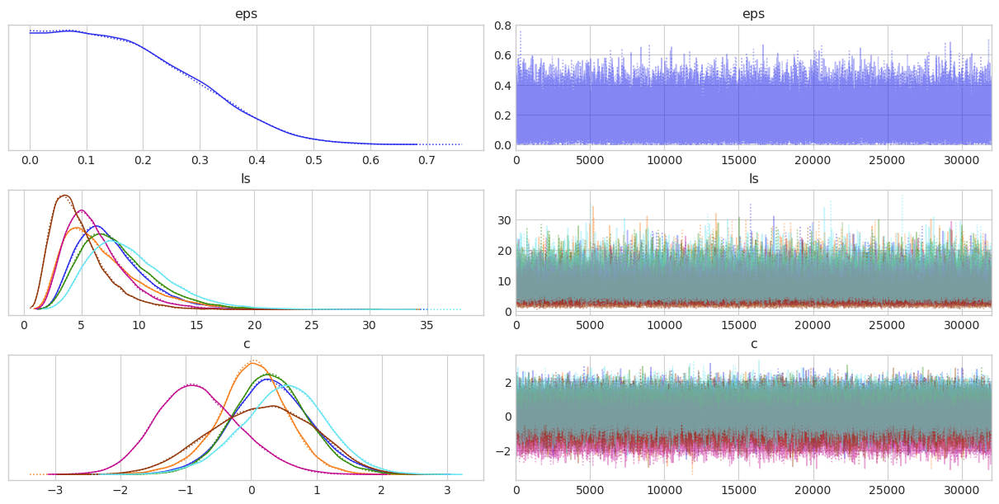

In [142]:
plot_trace(trace, ['eps', 'ls', 'c'])

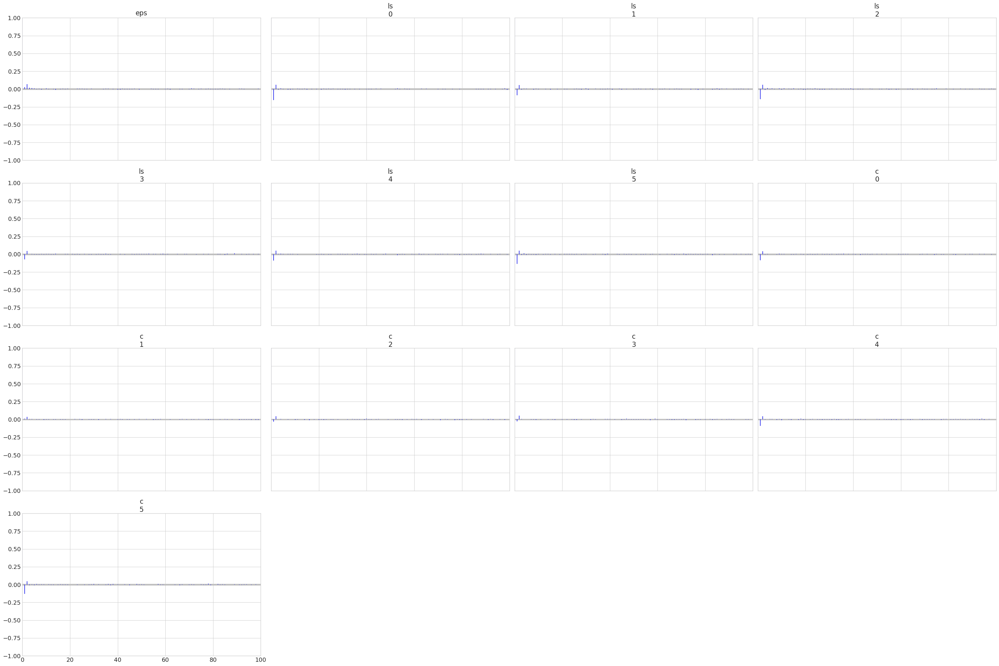

In [143]:
az.plot_autocorr(trace, var_names=['eps', 'ls', 'c'], combined=True)
plt.show()

In [197]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


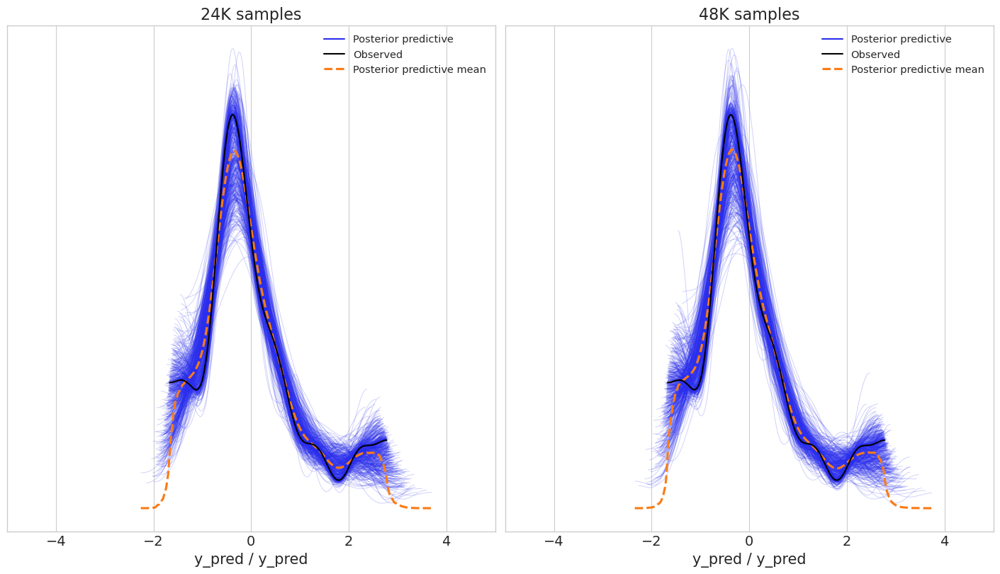

In [200]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('24K samples')
ax2.set_title('48K samples')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['all_exp_linear']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

In [53]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("24K MAE: {:.4f} (Tonnes / Ha)".format(results['all_exp_linear']['mae'] * 1e-4))
print("48K MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

24K MAE: 0.1619 (Tonnes / Ha)
48K MAE: 0.1642 (Tonnes / Ha)


<font size=5>
It seems the 24K samples are still sufficient

In [201]:
results['all_exp_linear2'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Removing Data Outliers (based on Pesticides Skewness)
<font size=5>
Same experiment done with classic Bayesian Regression previously

In [27]:
# Set random seed
np.random.seed(42)

# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)
cy = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)

<font size=5>
Remove countries having pesticides usage lower than the first quartile

In [28]:
q = cy.quantile(0.25)['pesticides_kg_per_ha']
print("Removing samples having Pesticides (Kg/Ha) lower than {:.3f}\n".format(q))
cy = cy[cy['pesticides_kg_per_ha'] > q].reset_index()

# Get geodata for plot world map
countries = cy['Area'].unique()
world = get_geodata(countries)

# Get the features and the target feature
cy = cy.drop('Area', axis=1)
print(cy.describe())
x_data = cy.drop('hg/ha_yield', axis=1).to_numpy()
y_data = cy['hg/ha_yield'].to_numpy()

# Set the indices of the sample for testing
num_test_results = 8
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)
train_indices = np.array([i for i in range(len(y_data)) if i not in test_indices])

# Standardize the data
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

# Get 10 samples to plot
x_test_std_data, y_test_std_data = x_std_data[test_indices], y_std_data[test_indices]

y_data_full = y_data.copy()
x_test_data, y_test_data = x_data[test_indices], y_data[test_indices]

n_samples, n_features = x_std_data.shape
x_std_data.shape, y_std_data.shape, x_test_std_data.shape, y_test_std_data.shape

Removing samples having Pesticides (Kg/Ha) lower than 0.218

           index    hg/ha_yield  avg_rain_mm_per_year  pesticides_kg_per_ha  \
count  71.000000      71.000000             71.000000             71.000000   
mean   47.070423  209207.604397            992.732394              4.171597   
std    28.289485   92567.323537            674.342303              4.216158   
min     0.000000   75126.304348             51.000000              0.227468   
25%    23.500000  144101.136646            590.000000              1.170934   
50%    45.000000  182060.304348            703.000000              2.737318   
75%    72.500000  245124.804348           1449.500000              6.262172   
max    94.000000  448891.538462           3240.000000             20.888427   

        avg_temp        lat         lon         elev  
count  71.000000  71.000000   71.000000    71.000000  
mean   15.935264  26.853878   11.358560   590.591549  
std     7.166818  27.552086   57.150321   538.407243  
min    

((71, 7), (71,), (8, 7), (8,))

<font size=5>
    Rebuild the same model <i>Exponential * Linear </i>

In [29]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [156]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
        target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1018 seconds.


<br><br>
<font size=5>
Comparison of noises:
    
<font size=5>
All data

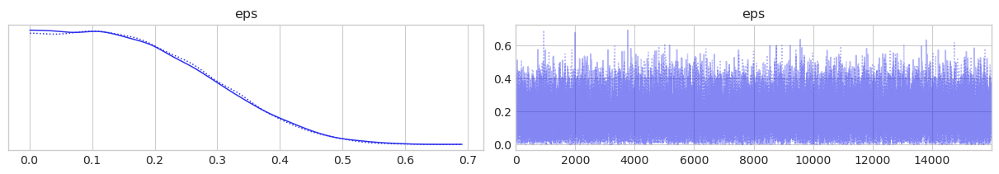

In [24]:
plot_trace(results['all_exp_linear']['trace'], ['eps'])

<font size=5>
Without outliers

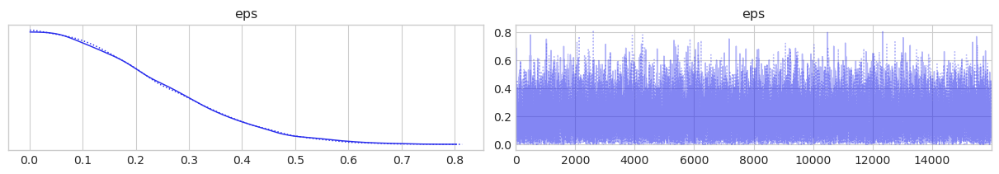

In [21]:
plot_trace(trace, ['eps'])

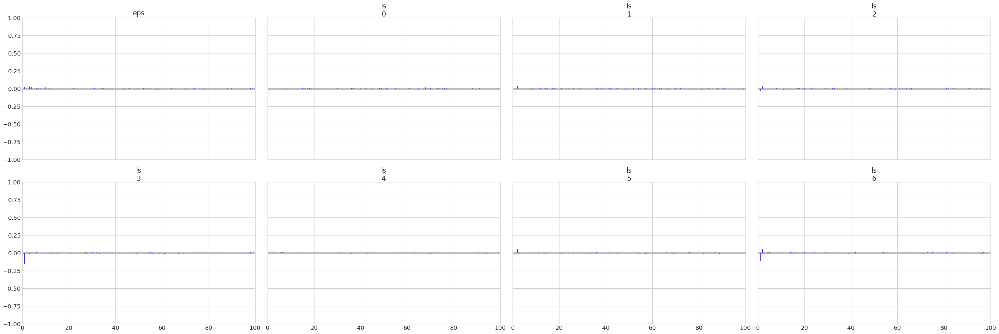

In [158]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [210]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


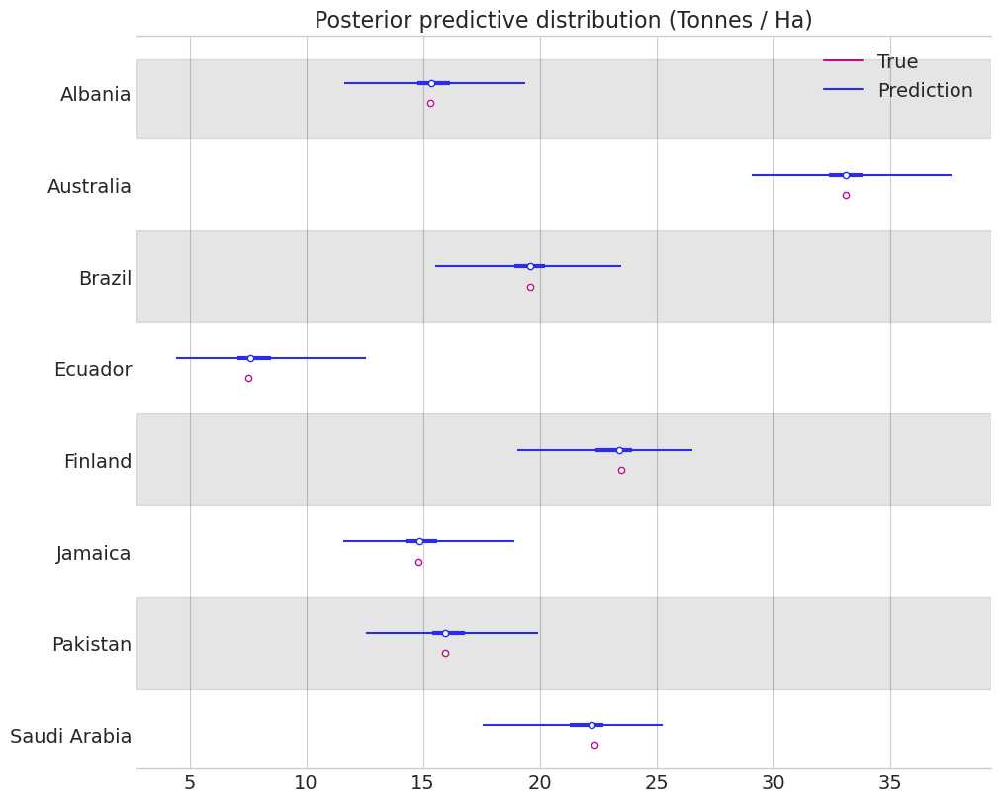

In [211]:
plot_test(pred_samples[:, test_indices], y_mean, y_stddev,
          y_test_data, countries[test_indices])

In [58]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("Complete MAE: {:.4f} (Tonnes / Ha)".format(results['all_exp_linear']['mae'] * 1e-4))
print("Reduced  MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

Complete MAE: 0.1619 (Tonnes / Ha)
Reduced  MAE: 0.0634 (Tonnes / Ha)


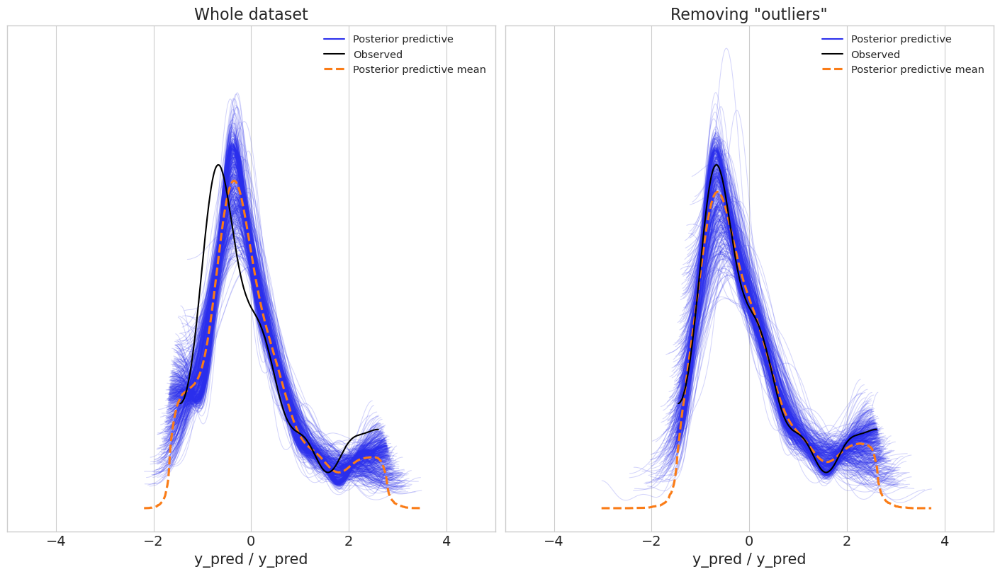

In [30]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 8), sharex=True, sharey=True)
ax1.set_title('Whole dataset')
ax2.set_title('Removing "outliers"')

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':results['all_exp_linear2']['pred_samples']}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax1)
ax1.set_xlim((-5, 5))
plt.plot()

ppc_data = az.from_pymc3(posterior_predictive={'y_pred':pred_samples}, model=model)
az.plot_ppc(ppc_data, num_pp_samples=512, ax=ax2)
ax1.set_xlim((-5, 5))
plt.plot()
plt.show()

<font size=5>
Obeserved refers to the data without outliers;
    
thus, the posterior shown is shifted

In [214]:
results['out_exp_linear'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

---

<font size=5>
The little improvement can be due to the reduce of noise by removing points <br>
We try now to remove 25% random of points  
    
---

In [40]:
# Set random seed
np.random.seed(42)

# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)
cy = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)
cy

,Area,hg/ha_yield,avg_rain_mm_per_year,pesticides_kg_per_ha,avg_temp,lat,lon,elev
0,Albania,153105.043478,1485.0,2.184838,16.326957,41.0,20.0,708.0
1,Algeria,182413.956522,89.0,1.110530,17.488261,28.0,3.0,800.0
2,Angola,59085.739130,1010.0,0.027360,24.303043,-12.5,18.5,1112.0
3,Argentina,262059.173913,591.0,2.488804,17.708478,-34.0,-64.0,595.0
4,Armenia,151076.904762,562.0,0.493300,9.580952,40.0,45.0,1792.0
...,...,...,...,...,...,...,...,...
90,Ukraine,125038.857143,565.0,2.121930,8.413333,49.0,32.0,175.0
91,United Kingdom,406131.695652,1220.0,6.246453,9.602783,54.0,-2.0,75.0
92,Uruguay,146737.043478,1300.0,6.608791,16.980870,-33.0,-56.0,109.0
93,Zambia,115800.652174,1020.0,1.066569,21.064783,-15.0,30.0,1138.0


<font size=5>
Let's take 24 random points

In [41]:
removed = np.random.choice(np.arange(len(cy)), size=24, replace=False)
removed

array([68, 22, 72, 73,  0, 26, 40, 42, 10, 45, 84, 55, 81, 47, 12,  4, 18,
       28, 39, 66, 15, 78, 79, 30])

In [42]:
cy = cy.drop(removed)

In [43]:
# Get geodata for plot world map
countries = cy['Area'].unique()
world = get_geodata(countries)

# Get the features and the target feature
cy = cy.drop('Area', axis=1)
print(cy.describe())
x_data = cy.drop('hg/ha_yield', axis=1).to_numpy()
y_data = cy['hg/ha_yield'].to_numpy()

# Set the indices of the sample for testing
num_test_results = 8
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)
train_indices = np.array([i for i in range(len(y_data)) if i not in test_indices])

# Standardize the data
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

# Get 10 samples to plot
x_test_std_data, y_test_std_data = x_std_data[test_indices], y_std_data[test_indices]

y_data_full = y_data.copy()
x_test_data, y_test_data = x_data[test_indices], y_data[test_indices]

n_samples, n_features = x_std_data.shape
x_std_data.shape, y_std_data.shape, x_test_std_data.shape, y_test_std_data.shape

         hg/ha_yield  avg_rain_mm_per_year  pesticides_kg_per_ha   avg_temp  \
count      71.000000             71.000000             71.000000  71.000000   
mean   182264.310029           1050.732394              3.200400  18.036030   
std     95611.039932            710.134232              4.284056   7.029897   
min     31272.043478             51.000000              0.005855   3.459565   
25%    125470.276398            592.000000              0.207878  11.266587   
50%    161995.695652            788.000000              1.590888  19.490870   
75%    227522.630435           1506.500000              3.974542  24.710609   
max    448891.538462           3240.000000             20.888427  28.737391   

             lat         lon         elev  
count  71.000000   71.000000    71.000000  
mean   19.050592   12.768419   671.591549  
std    27.853850   57.955648   620.729354  
min   -41.000000 -102.000000    30.000000  
25%    -0.500000   -4.500000   309.000000  
50%    20.000000   19.37

((71, 6), (71,), (8, 6), (8,))

<font size=5>
    Rebuild again the same model <i>Exponential * Linear </i>

In [65]:
# Build a PyMC3 GP regression model
with pm.Model() as model:
    # Instantiate a hyper-prior on the covariance function's parameter
    ls = pm.Gamma('ls', 2.0, 0.5, shape=n_features)
    c = pm.Normal('c', 0, 8, shape=n_features)
    # Instantiate the covariance function
    cov = pm.gp.cov.Exponential(n_features, ls=ls) * \
        pm.gp.cov.Linear(n_features, c=c) + \
        pm.gp.cov.WhiteNoise(1e-5)
    # Instantiate the GP marginal variable
    gp = pm.gp.Marginal(cov_func=cov)
    eps = pm.HalfCauchy('eps', 5.0)
    # Likelihood
    y_pred = gp.marginal_likelihood('y_pred', X=x_std_data, y=y_std_data, noise=eps)
    gp_model = GaussianProcess(model=model, gp=gp)

In [66]:
# Sample from posterior
with model:
    trace = pm.sample(
        draws=16_000, tune=8_000,
        chains=2, cores=1, random_seed=42,
        return_inferencedata=True,
        target_accept=0.9
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [eps, c, ls]


Sampling 2 chains for 8_000 tune and 16_000 draw iterations (16_000 + 32_000 draws total) took 1068 seconds.


<br><br>
<font size=5>
Comparison of noises:
    
<font size=5>
All data

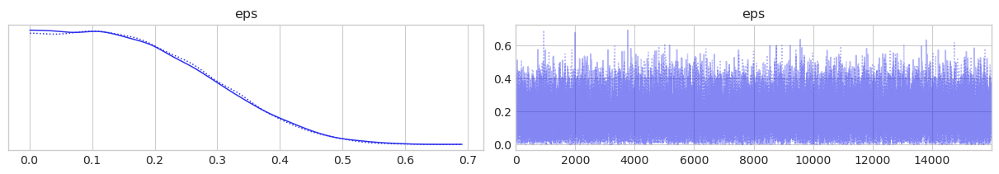

In [37]:
plot_trace(results['all_exp_linear']['trace'], ['eps'])

<font size=5>
Removing random

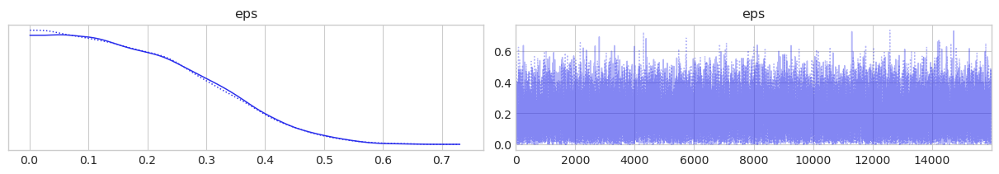

In [34]:
plot_trace(trace, ['eps'])

<font size=5>
Removing outliers

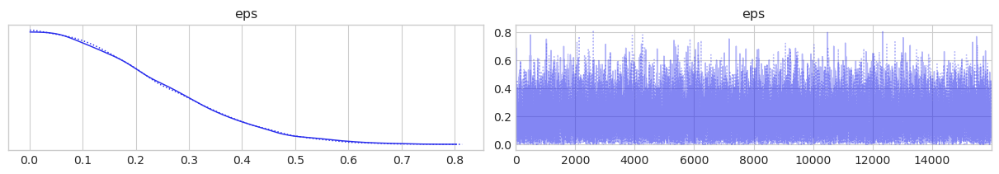

In [33]:
plot_trace(results['out_exp_linear']['trace'], ['eps'])

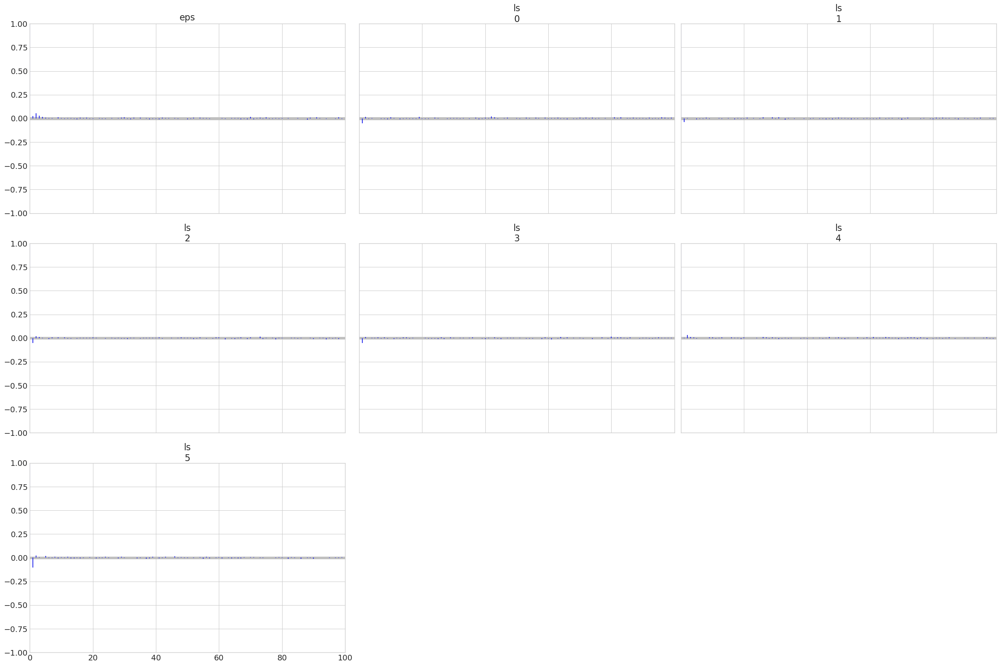

In [69]:
az.plot_autocorr(trace, var_names=['eps', 'ls'], combined=True)
plt.show()

In [70]:
pred_samples = gp_model.sample_conditional(trace, x_std_data, 'f_pred', num_pred_samples=2048)

C:\Users\PasqualeDeMarinis\.conda\envs\pymc_env\lib\site-packages\pymc3\distributions\posterior_predictive.py:248: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  warnings.warn(


In [44]:
mae = compute_mae(pred_samples, y_mean, y_stddev, y_data)
print("All data         MAE: {:.4f} (Tonnes / Ha)".format(results['all_exp_linear']['mae'] * 1e-4))
print("Outliers removed MAE: {:.4f} (Tonnes / Ha)".format(results['out_exp_linear']['mae'] * 1e-4))
print("Random  removed  MAE: {:.4f} (Tonnes / Ha)".format(mae * 1e-4))

All data         MAE: 0.1619 (Tonnes / Ha)
Outliers removed MAE: 0.0634 (Tonnes / Ha)
Random  removed  MAE: 0.1540 (Tonnes / Ha)


<font size=5>
We can state we have a noise reduction by removing outliers

In [73]:
results['outrandom_exp_linear'] = {
    'trace': trace,
    'pred_samples': pred_samples,
    'mae': mae,
    'r2': r2,
}

## Save and load results

In [12]:
# Load results
with open('yp_potato.pickle', 'rb') as handle:
    results = pickle.load(handle)

In [75]:
# Save results
with open('yp_potato.pickle', 'wb') as handle:
    pickle.dump(results, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [38]:
rs = results['outrandom_exp_linear']
trace = rs['trace']
pred_samples = rs['pred_samples']
mae = rs['mae']
r2 = rs['r2']

In [74]:
results.keys()

dict_keys(['expquad1', 'expquad2', 'expquad3', 'expquad4', 'poly', 'exp', 'exp_linear_sum', 'exp_linear_weighted', 'exp_linear_mul', 'all_exp_linear', 'all_exp_linear2', 'out_exp_linear', 'poly3', 'rat', 'outrandom_exp_linear'])

In [13]:
rs = results['expquad4']
trace = rs['trace']
pred_samples = rs['pred_samples']
mae = rs['mae']
r2 = rs['r2']